# BigBrain SWM

### Libraries

In [1]:
import pandas as pd
import numpy as np
import os
import glob
import nibabel as nb
import scipy.stats
import scipy.interpolate
from brainspace.mesh.mesh_io import read_surface
from brainspace.plotting import plot_hemispheres
from brainspace.gradient import GradientMaps
from brainspace.mesh.array_operations import smooth_array
from brainspace.mesh.mesh_creation import build_polydata
import seaborn as sns
from brainspace.datasets import load_mask
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.linear_model import RANSACRegressor
import copy
import cmocean
import scipy as sp

### Load surfaces and masks

In [2]:
# Path to MICAPIPEsurf = mask_5k !
micapipe=os.popen("echo $MICAPIPE").read()[:-1]
BB = '/host/percy/local_raid/youngeun/sub-BigBrain/Histological-Space'

# Load fsLR 32k
f32k_lh = read_surface(micapipe + '/surfaces/fsLR-32k.L.surf.gii', itype='gii')
f32k_rh = read_surface(micapipe + '/surfaces/fsLR-32k.R.surf.gii', itype='gii')
# Load fsLR 32k inflated
f32k_inf_lh = read_surface(micapipe + '/surfaces/fsLR-32k.L.inflated.surf.gii', itype='gii')
f32k_inf_rh = read_surface(micapipe + '/surfaces/fsLR-32k.R.inflated.surf.gii', itype='gii')
# Load fsLR 5k
f5k_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.surf.gii', itype='gii')
f5k_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.surf.gii', itype='gii')
# Load fsLR 5k inflated
f5k_inf_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
f5k_inf_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')
# Load fsaverage5
fs5_lh = read_surface(micapipe + '/surfaces/fsaverage5/surf/lh.pial', itype='fs')
fs5_rh = read_surface(micapipe + '/surfaces/fsaverage5/surf/rh.pial', itype='fs')
# Load fsaverage5 inflated
fs5_inf_lh = read_surface(micapipe + '/surfaces/fsaverage5/surf/lh.inflated', itype='fs')
fs5_inf_rh = read_surface(micapipe + '/surfaces/fsaverage5/surf/rh.inflated', itype='fs')

# Load native mid surface
inf_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
inf_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')
mask_lh =  nb.load(micapipe + '/surfaces/fsLR-5k.R.mask.shape.gii').darrays[0].data
mask_rh =  nb.load(micapipe + '/surfaces/fsLR-5k.L.mask.shape.gii').darrays[0].data
mask_5k = np.concatenate((mask_lh, mask_rh), axis=0)

BB_lh = read_surface(BB + '/white_left_327680.surf.gii', itype='gii')
BB_rh = read_surface(BB + '/white_right_327680.surf.gii', itype='gii')

# Labels and boolean mask
mask_surf = mask_5k != 0

# Load fsLR masks
mask_32k = load_mask(join=True)
mask_lh =  nb.load(micapipe + '/surfaces/fsLR-5k.L.mask.shape.gii').darrays[0].data
mask_rh =  nb.load(micapipe + '/surfaces/fsLR-5k.R.mask.shape.gii').darrays[0].data
mask_5k = np.concatenate((mask_lh, mask_rh), axis=0)

# Load fsaverage5 mask
# Load LEFT annotation file in fsaverage5
annot_lh_fs5= nb.freesurfer.read_annot(f'{micapipe}/parcellations/lh.schaefer-400_mics.annot')
# Unique number of labels of a given atlas
Ndim = max(np.unique(annot_lh_fs5[0]))
# Load RIGHT annotation file in fsaverage5
annot_rh_fs5= nb.freesurfer.read_annot(f'{micapipe}/parcellations/rh.schaefer-400_mics.annot')[0]+Ndim
# replace with 0 the medial wall of the right labels
annot_rh_fs5 = np.where(annot_rh_fs5==Ndim, 0, annot_rh_fs5)
# fsaverage5 labels
labels_fs5 = np.concatenate((annot_lh_fs5[0], annot_rh_fs5), axis=0)
# Mask of the medial wall on fsaverage 5
mask_fs5 = labels_fs5 != 0

### Functions

In [3]:
def inflate_surf(orig_lh, orig_rh, ref_lh, ref_rh, W=0.15):
    """
    This functions inflates a surface a determined amount [W{0:1}] to a reference
    
    Parameters
    ----------
        orig_lh : vtkPolyData or VTKObjectWrapper
                    left input original surface
        orig_rh : vtkPolyData or VTKObjectWrapper
                    right input original surface
        ref_lh  : vtkPolyData or VTKObjectWrapper
                    left input reference surface
        ref_rh  : vtkPolyData or VTKObjectWrapper
                    right input reference surface
        W       : float value from 0 to 1
        
    Returns
    -------
        new_lh : vtkPolyData or VTKObjectWrapper
                    left output inflated surface
        new_rh : vtkPolyData or VTKObjectWrapper
                    right output inflated surface
        
    """
    def inflate(orig, ref, Winf):
        # Convert BSPolyData objects to numpy arrays
        inf_coord = copy.copy(orig.points)
        inf_triag = copy.copy(orig.GetCells2D())
        
        # Inflated mean surface
        maxs = np.max(orig.points, axis=0)
        mins = np.min(orig.points, axis=0)
        maxsp = np.max(ref.points, axis=0)
        minsp = np.min(ref.points, axis=0)
        
        for i in range(3):
            inf_coord[:,i] = (((ref.points[:, i] - minsp[i]) / (maxsp[i] - minsp[i]))
                                 * (maxs[i] - mins[i]) + mins[i]) * Winf + orig.points[:, i] * (1 - Winf)
        
        # Create the new surface
        new_surf = build_polydata(inf_coord, cells=inf_triag)
        
        return(new_surf)
    
    new_lh = inflate(orig_lh, ref_lh, Winf=W)
    new_rh = inflate(orig_rh, ref_rh, Winf=W)
    
    return(new_lh, new_rh)

# Smooth intencities
def smooth_surf(surf_l, surf_r, points, Mask, Kernel='uniform', Niter=3, Relax=0.35):
    '''
    This function smooth an array (left and right) on a given surface
    Parameters
    ----------
    surf_l : np.array left surface 
    surf_r : np.array right surface
    points : np.array surface data
    Kernel : {'uniform', 'gaussian', 'inverse_distance'}
    Niter  : int, optional Number of smooth iterations
    Relax  : relax : float, optional relaxation factor
    Mask   : str or 1D ndarray, optional
    Returns
    -------
    sdata : smoothed numpy array
    
    '''
    Ndim = Mask.shape[0] 
    n2dim = int(Ndim/2)
    Mask_l=Mask[0:n2dim]
    Mask_r=Mask[n2dim:Ndim]
    sdata = np.concatenate((smooth_array(surf_l, points[0:n2dim],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_l), 
                          smooth_array(surf_r, points[n2dim:Ndim],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_r)), axis=0)
    return(sdata)

# Smooth each intencity
def smooth_intensities(int_profile):
    smoothed_i = np.copy(int_profile)
   
    # smooth each intensity
    for i in range(int_profile.shape[0]):
        smoothed_i[i,:] = smooth_surf(inf_lh, inf_rh, int_profile[i,:], mask_surf, Niter=5, Relax=0.5, Kernel='uniform')
   
    return(smoothed_i)

### Functions for plotting histogram & correcting outliers

In [4]:
def plot_histogram(data, bins=2000, title='Histogram', cmap='afmhot', Range=(0, 2500),
                   xlim=[0,2500], ylim=2000, mode_value=None, val2=None):
    non_zero_values = data[data != 0]
    n, bins, _ = plt.hist(non_zero_values, bins=bins, color='blue', alpha=0.7)
    bin_centers = (bins[:-1] + bins[1:]) / 2  # Compute the bin centers
    
    colormap = cm.get_cmap(cmap)
    colored_bins = colormap(np.interp(bin_centers, [Range[0], Range[1]], [0, 1]))
    plt.bar(bin_centers, n, width=np.diff(bin_centers[0:2]), color=colored_bins)
    
    plt.title(title)
    #plt.xlabel('Intensity Value')
    #plt.ylabel('Frequency')

    # Remove the outer box line
    for spine in plt.gca().spines.values():
        spine.set_visible(False)
    # Set the grid on the back
    plt.gca().set_axisbelow(True)
    plt.grid(color='gray', linestyle='dashed')

    # Plot a vertical line at the mode value
    if mode_value is not None:
        plt.axvline(x=mode_value[0], color='blue', linestyle='dashed', linewidth=2, label=f'Mode = {mode_value[0]}')
        plt.axvline(x=mode_value[1], color='green', linestyle='dashed', linewidth=2, label=f'Mode = {mode_value[1]}')
    if val2 is not None:
        plt.axvline(x=val2, color='white', linestyle='dashed', linewidth=2, label=f'ModeMRtrix = {val2}')
    
    plt.legend()
    
    # Set x-axis range (adjust as needed)
    plt.xlim(xlim)

    # Set y-axis range (adjust as needed)
    plt.ylim([0, ylim])
    
    plt.show()

def fill_missing_GM(cdata):
    # Calculate global median
    global_median = np.nanmedian(cdata)

    # Identify outliers based on a threshold from the global median
    outlier_threshold = 4 * np.nanstd(cdata)
    outliers = np.abs(cdata - global_median) > outlier_threshold

    # Set outliers to NaN
    cdata[outliers] = np.nan

    # Interpolate NaNs
    good = np.where(~np.isnan(cdata))
    bad = np.where(np.isnan(cdata))
    fill = scipy.interpolate.griddata(good, cdata[good], bad)
    cdata[bad] = fill

    # Extrapolate any remaining missing values
    good = np.where(~np.isnan(cdata))
    bad = np.where(np.isnan(cdata))
    fill = scipy.interpolate.griddata(good, cdata[good], bad, method='nearest')
    cdata[bad] = fill
    
    return cdata

def fill_missing_IQR(cdata):
    # Calculate the first and third quartiles
    Q1 = np.nanpercentile(cdata, 25)
    Q3 = np.nanpercentile(cdata, 75)

    # Calculate the interquartile range (IQR)
    IQR = Q3 - Q1

    # Define the outlier threshold based on IQR
    outlier_threshold = 1.5 * IQR

    # Identify outliers based on IQR
    outliers_upper = cdata > Q3 + outlier_threshold
    outliers_lower = cdata < Q1 - outlier_threshold
    outliers = outliers_upper | outliers_lower

    # Set outliers to NaN
    cdata[outliers] = np.nan

    # Interpolate NaNs
    good = np.where(~np.isnan(cdata))
    bad = np.where(np.isnan(cdata))
    fill = scipy.interpolate.griddata(good, cdata[good], bad)
    cdata[bad] = fill

    # Extrapolate any remaining missing values
    good = np.where(~np.isnan(cdata))
    bad = np.where(np.isnan(cdata))
    fill = scipy.interpolate.griddata(good, cdata[good], bad, method='nearest')
    cdata[bad] = fill
    
    return cdata

def fill_missing_Turkey(cdata):
    # Calculate the first and third quartiles
    Q1 = np.nanpercentile(cdata, 25)
    Q3 = np.nanpercentile(cdata, 75)

    # Calculate the interquartile range (IQR)
    IQR = Q3 - Q1

    # Define the outlier thresholds based on Tukey's method
    lower_threshold = Q1 - 1.5 * IQR
    upper_threshold = Q3 + 1.5 * IQR

    # Identify outliers based on Tukey's method
    outliers = (cdata < lower_threshold) | (cdata > upper_threshold)

    # Set outliers to NaN
    cdata[outliers] = np.nan

    # Interpolate NaNs
    good = np.where(~np.isnan(cdata))
    bad = np.where(np.isnan(cdata))
    fill = scipy.interpolate.griddata(good, cdata[good], bad)
    cdata[bad] = fill

    # Extrapolate any remaining missing values
    good = np.where(~np.isnan(cdata))
    bad = np.where(np.isnan(cdata))
    fill = scipy.interpolate.griddata(good, cdata[good], bad, method='nearest')
    cdata[bad] = fill
    
    return cdata

### Functions for loading data

In [5]:
def load_SWM_group(surf):

    # Set directories
    if surf == 'fsLR32k':
        dir_surf = "/host/percy/local_raid/youngeun/sub-BigBrain/Histological-Space/200um/SWM_50map-fsLR32k/"
    elif surf == 'fsLR5k':
        dir_surf = "/host/percy/local_raid/youngeun/sub-BigBrain/Histological-Space/200um/SWM_50map-fsLR5k/"
    elif surf == 'fsaverage5':
        dir_surf = "/host/percy/local_raid/youngeun/sub-BigBrain/Histological-Space/200um/SWM_50map-fsaverage5/"
    
    # List the files
    files_lh = sorted(glob.glob(dir_surf + f"sub-BigBrain_hemi-L_surf-{surf}_label-swm*mm.func.gii"))
    files_rh = sorted(glob.glob(dir_surf + f"sub-BigBrain_hemi-R_surf-{surf}_label-swm*mm.func.gii"))
    
    # Load all the SWM data
    Nqmri=np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]
    surf_map=np.empty([len(files_lh), Nqmri], dtype=float)
    for i, _ in enumerate(files_lh):
        surf_map[i,:] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))
    
    # Mean matrix across the x axis (vertices)
    map_mean = np.mean(surf_map, axis=0)
        
    N = surf_map.shape[0]     
    print(f"Numer of surfaces: {N}") 

    return map_mean, surf_map

def load_SWM_group_5k(surf):

    # Set directories
    if surf == 'fsLR32k':
        dir_surf = "/host/percy/local_raid/youngeun/sub-BigBrain/Histological-Space/200um/SWM_50map-fsLR32k/"
    elif surf == 'fsLR5k':
        dir_surf = "/host/percy/local_raid/youngeun/sub-BigBrain/Histological-Space/200um/SWM_50map-fsLR5k/"
    elif surf == 'fsaverage5':
        dir_surf = "/host/percy/local_raid/youngeun/sub-BigBrain/Histological-Space/200um/SWM_50map-fsaverage5/"
    
    # List the files
    files_lh = sorted(glob.glob(dir_surf + f"sub-BigBrain_hemi-L_surf-{surf}_label-swm*mm.func.gii"))
    files_rh = sorted(glob.glob(dir_surf + f"sub-BigBrain_hemi-R_surf-{surf}_label-swm*mm.func.gii"))
    
    # Load all the SWM data
    Nqmri=np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]
    surf_map=np.empty([len(files_lh), Nqmri], dtype=float)
    for i, _ in enumerate(files_lh):
        surf_map[i,:] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))

    filled_matrix = np.empty_like(surf_map)
    for i, row in enumerate(surf_map):
        filled_matrix[i] = fill_missing_Turkey(row)
    
    # Load intensity profiles from each file
    for row in filled_matrix:
        # Smooth each intensity
        profile_smooth = smooth_intensities(filled_matrix)
        # Replace values in midwall with NaN where mask_10k is False
        profile_smooth[:, mask_5k == False] = np.nan
        #profile_smooth = profile_smooth[1:]
    
    # Mean matrix across the x axis (vertices)
    map_mean = np.mean(profile_smooth, axis=0)
        
    N = filled_matrix.shape[0]     
    print(f"Numer of surfaces: {N}") 

    return map_mean, profile_smooth

def load_GM_group_5k():
    # Set directories
    surf == 'gm_fsLR5k'
    dir_surf = "/host/percy/local_raid/youngeun/sub-BigBrain/Histological-Space/from_BigBrainWarp/fsLR5k/"
    
    # List the files
    files_lh = sorted(glob.glob(dir_surf + f"fsLR-5k.L_bigbrain_*.func.gii"))
    files_rh = sorted(glob.glob(dir_surf + f"fsLR-5k.R_bigbrain_*.func.gii"))
    
    # Load all the GM data
    Nqmri=np.concatenate((nb.load(files_lh[0]).darrays[0].data, nb.load(files_rh[0]).darrays[0].data), axis=0).shape[0]
    surf_map=np.empty([len(files_lh), Nqmri], dtype=float)
    for i, _ in enumerate(files_lh):
        surf_map[i,:] = np.hstack(np.concatenate((nb.load(files_lh[i]).darrays[0].data, nb.load(files_rh[i]).darrays[0].data), axis=0))

    filled_matrix = np.empty_like(surf_map)
    for i, row in enumerate(surf_map):
        filled_matrix[i] = fill_missing_Turkey(row)
    
    # Load intensity profiles from each file
    for row in filled_matrix:
        # Smooth each intensity
        profile_smooth = smooth_intensities(filled_matrix)
        # Replace values in midwall with NaN where mask_10k is False
        profile_smooth[:, mask_5k == False] = np.nan
        #profile_smooth = profile_smooth[1:]
    
    # Mean matrix across the x axis (vertices)
    map_mean = np.mean(profile_smooth, axis=0)
        
    N = filled_matrix.shape[0]     
    print(f"Numer of surfaces: {N}") 

    return map_mean, profile_smooth

## fsLR32k surfaces

In [16]:
mean32k, map32k = load_SWM_group(surf='fsLR32k')
mean32k[mask_32k==False] = np.nan
#map32k[np.isnan(map32k)] = 0

print(map32k.shape)

Numer of surfaces: 51
(51, 64984)


### original fsLR32k

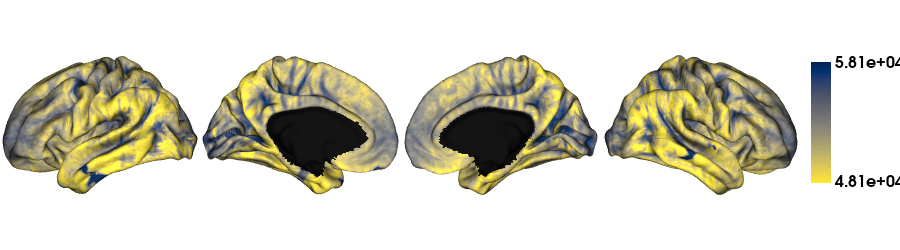

In [17]:
# Plot average SWM surfaces
crange=(np.quantile(mean32k[mask_32k==True], 0.05), np.quantile(mean32k[mask_32k==True], 0.99))
plot_hemispheres(f32k_lh, f32k_rh, array_name=mean32k, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False, color_range=crange)

### Outliers corrected fsLR32k

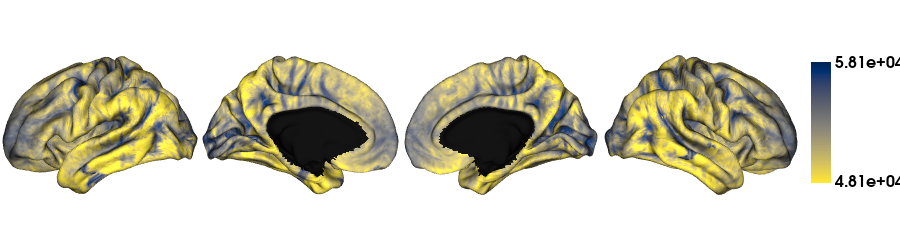

In [18]:
# Correct outliers
corr_mean32k = fill_missing_Turkey(mean32k)
corr_mean32k[mask_32k==False] = np.nan

# Plot average SWM surfaces
plot_hemispheres(f32k_lh, f32k_rh, array_name=corr_mean32k, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False, color_range=crange)

/tmp/ipykernel_428835/171754979.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap(cmap)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


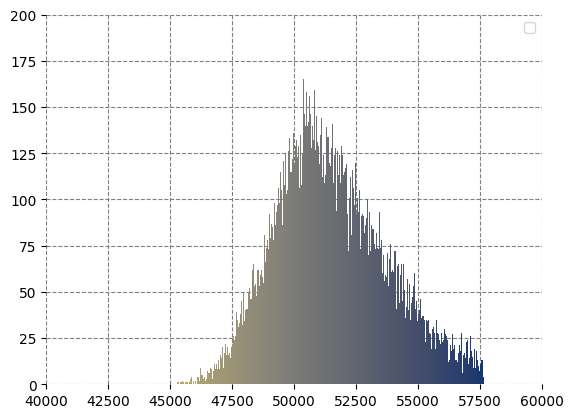

In [46]:
xlim = [40000,60000]
plot_histogram(mean32k, bins=1000, title='', cmap='cividis_r', Range=xlim,
                   xlim=xlim, ylim=200, mode_value=None, val2=None)

## fsLR5k surfaces

In [6]:
mean5k, map5k = load_SWM_group_5k(surf='fsLR5k')
mean5k[mask_5k==False] = np.nan
#map5k[np.isnan(map5k)] = 0

Numer of surfaces: 51


### Outliers corrected + Smoothed fsLR5k

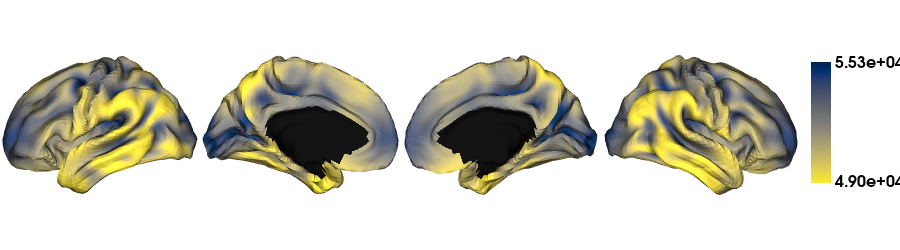

In [7]:
# Plot average SWM surfaces
crange=(np.quantile(mean5k[mask_5k==True], 0.05), np.quantile(mean5k[mask_5k==True], 0.99))
plot_hemispheres(f5k_lh, f5k_rh, array_name=mean5k, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False, color_range=crange)

/tmp/ipykernel_1853866/171754979.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap(cmap)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


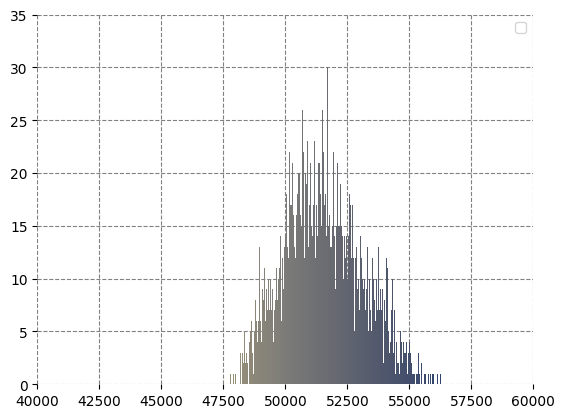

In [13]:
xlim = [40000,60000]
plot_histogram(mean5k, bins=1000, title='', cmap='cividis_r', Range=xlim,
                   xlim=xlim, ylim=35, mode_value=None, val2=None)

### Outliers corrected fsLR5k (without smoothing)

In [23]:
mean5k, map5k = load_SWM_group_5k(surf='fsLR5k')
mean5k[mask_5k==False] = np.nan
#map5k[np.isnan(map5k)] = 0

Numer of surfaces: 51


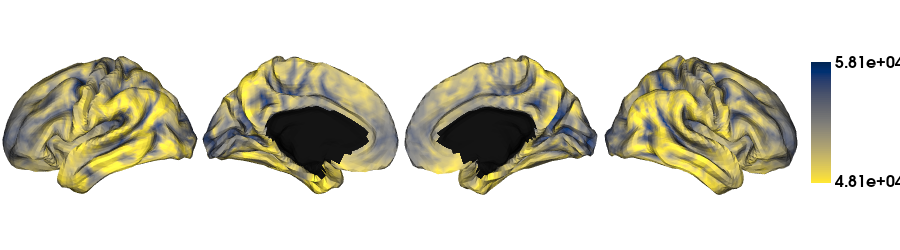

In [53]:
# Plot average SWM surfaces
plot_hemispheres(f5k_lh, f5k_rh, array_name=mean5k, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False, color_range=crange)

## fsaverage5

In [14]:
meanfs5, mapfs5 = load_SWM_group(surf='fsaverage5')
meanfs5[mask_fs5==False] = np.nan
#mapfs5[np.isnan(mapfs5)] = 0

Numer of surfaces: 51


### Original fsaverage5

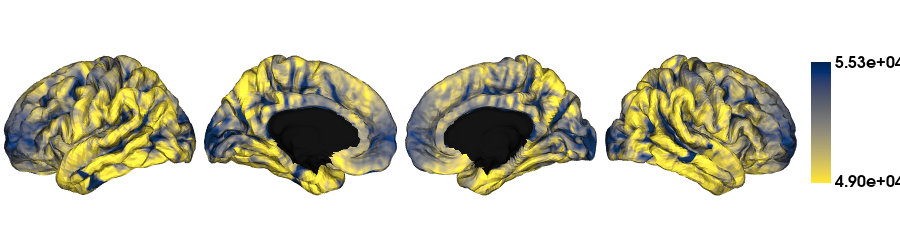

In [15]:
# Plot average SWM surfaces
plot_hemispheres(fs5_lh, fs5_rh, array_name=meanfs5, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False, color_range=crange)

### Outliers corrected fsaverage5

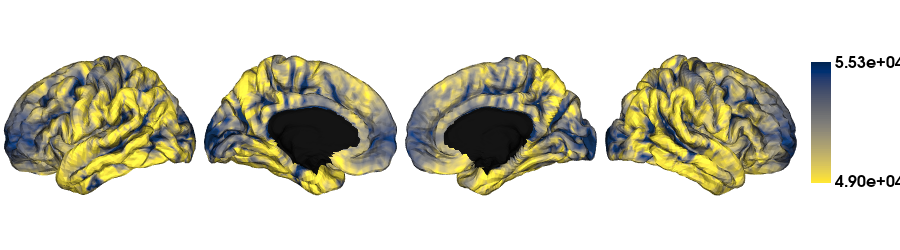

In [16]:
# Correct outliers
corr_meanfs5 = fill_missing_Turkey(meanfs5)
corr_meanfs5[mask_fs5==False] = np.nan

# Plot average SWM surfaces
plot_hemispheres(fs5_lh, fs5_rh, array_name=corr_meanfs5, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False, color_range=crange)

/tmp/ipykernel_1853866/171754979.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap(cmap)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


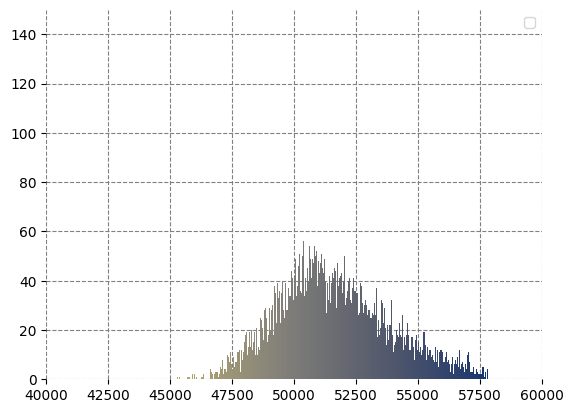

In [17]:
plot_histogram(meanfs5, bins=1000, title='', cmap='cividis_r', Range=xlim,
                   xlim=xlim, ylim=150, mode_value=None, val2=None)

## Regression for intensity correction

In [9]:
fsLR5k_L = f"/host/percy/local_raid/youngeun/surfaces/fsLR5k.L.shape.gii"
fsLR5k_R = f"/host/percy/local_raid/youngeun/surfaces/fsLR5k.R.shape.gii"
x_fsLR5k = np.concatenate((nb.load(fsLR5k_L).darrays[0].data, nb.load(fsLR5k_R).darrays[0].data))
y_fsLR5k = np.concatenate((nb.load(fsLR5k_L).darrays[1].data, nb.load(fsLR5k_R).darrays[1].data))
z_fsLR5k = np.concatenate((nb.load(fsLR5k_L).darrays[2].data, nb.load(fsLR5k_R).darrays[2].data))

In [ ]:
fsLR32k_L = f"/host/percy/local_raid/youngeun/surfaces/fsLR32k.L.shape.gii"
fsLR32k_R = f"/host/percy/local_raid/youngeun/surfaces/fsLR32k.R.shape.gii"
x_fsLR32k = np.concatenate((nb.load(fsLR32k_L).darrays[0].data, nb.load(fsLR32k_R).darrays[0].data))
y_fsLR32k = np.concatenate((nb.load(fsLR32k_L).darrays[1].data, nb.load(fsLR32k_R).darrays[1].data))
z_fsLR32k = np.concatenate((nb.load(fsLR32k_L).darrays[2].data, nb.load(fsLR32k_R).darrays[2].data))

In [10]:
mid_index = map5k.shape[0] // 2
mid_row = map5k[mid_index]
print(mid_row.shape)

(9684,)


In [11]:
# Sort the data by y-coornidate
sorted_indices = np.argsort(y_fsLR5k)
sorted_y_5k = y_fsLR5k[sorted_indices]

#sorted_indices = np.argsort(y_fsLR32k)
#sorted_y_32k = y_fsLR32k[sorted_indices]

### 1) Linear Regression

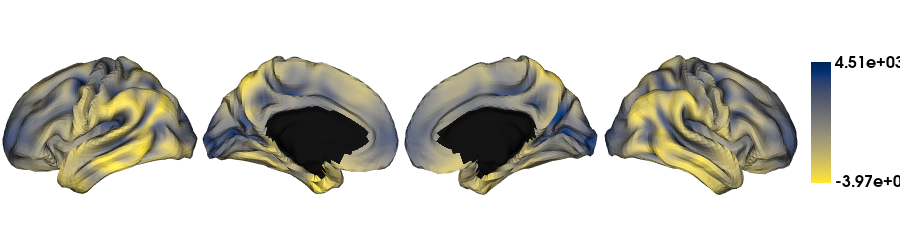

In [12]:
# Perform linear regression
model = LinearRegression()
model.fit(y_fsLR5k[mask_5k==True].reshape(-1, 1), mid_row[mask_5k==True])
# Predict intensity values using the regression model
predicted_intensity = model.predict(y_fsLR5k[mask_5k==True].reshape(-1, 1))

# Correct intensity values
corrected_intensity_profiles = np.empty_like(map5k)
for i, row in enumerate(map5k):
    corrected_intensity_values = row[mask_5k==True] - predicted_intensity

    # Initialize an array to hold corrected intensity values with NaNs
    reg_mean5k = np.full_like(mean5k, np.nan)
    # Get the indices where mask_5k is True
    indices_5k = np.where(mask_5k)
    # Update the corrected intensity values with the masked data
    reg_mean5k[indices_5k] = corrected_intensity_values
    corrected_intensity_profiles[i] = reg_mean5k 

Yregress_mean5k = np.mean(corrected_intensity_profiles, axis=0)

# Plot average SWM surfaces
plot_hemispheres(f5k_lh, f5k_rh, array_name=Yregress_mean5k, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False)

### 2) RANSAC Regression

In [143]:
# Perform RANSAC regression
ransac = RANSACRegressor()
ransac.fit(y_fsLR5k[mask_5k==True].reshape(-1, 1), mid_row[mask_5k==True])
predicted_intensity = ransac.predict(y_fsLR5k[mask_5k==True].reshape(-1, 1))

# Correct intensity values
corrected_intensity_profiles = np.empty_like(map5k)
for i, row in enumerate(map5k):
    corrected_intensity_values = row[mask_5k==True] - predicted_intensity

    # Initialize an array to hold corrected intensity values with NaNs
    reg_mean5k = np.full_like(mean5k, np.nan)
    # Get the indices where mask_5k is True
    indices_5k = np.where(mask_5k)
    # Update the corrected intensity values with the masked data
    reg_mean5k[indices_5k] = corrected_intensity_values
    corrected_intensity_profiles[i] = reg_mean5k 

RANSAC_mean5k = np.mean(corrected_intensity_profiles, axis=0)

# Plot average SWM surfaces
plot_hemispheres(f5k_lh, f5k_rh, array_name=RANSAC_mean5k, size=(600, 400), color_bar='right', zoom=1.6, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False, layout_style='grid')

NameError: name 'y_fsLR5k' is not defined

### 3) PCA

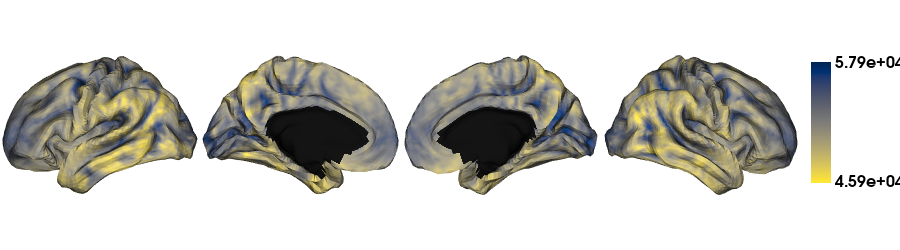

In [60]:
pca = PCA()
pca.fit(map5k[:, mask_5k==True])
pca_map5k = pca.inverse_transform(pca.transform(map5k[:, mask_5k==True]))

pca_corrected_map5k = np.empty_like(map5k)
for i, row in enumerate(pca_map5k):
    # Initialize an array to hold corrected intensity values with NaNs
    reg_mean5k = np.full_like(mean5k, np.nan)
    # Get the indices where mask_5k is True
    indices_5k = np.where(mask_5k)
    # Update the corrected intensity values with the masked data
    reg_mean5k[indices_5k] = pca_map5k[i]
    pca_corrected_map5k[i] = reg_mean5k

pca_mean5k = np.mean(pca_corrected_map5k, axis=0)

# Plot average SWM surfaces
plot_hemispheres(f5k_lh, f5k_rh, array_name=pca_mean5k, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False)

## Plot Intensity Profiles

In [215]:
# plot ridge plot
def plot_ridgeplot(matrix, matrix_df=None, Cmap='rocket', Range=(2.5, 4.5), Xlab="", save_path=None, title=None):
    import numpy as np
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    import matplotlib as mpl

    #mean_row_values = np.mean(matrix, axis=1)
    #sorted_indices = np.argsort(mean_row_values)
    #sorted_matrix = matrix[sorted_indices]
    #sorted_id_x = np.array(matrix_df)[sorted_indices]

    ai = matrix.flatten()
    subject = np.array([])
    id_x = np.array([])

    for i in range(matrix.shape[0]):
        label = np.array([str(i+1) for j in range(matrix.shape[1])])
        subject = np.concatenate((subject, label))
        id_label = np.array([matrix_df[i] for j in range(matrix.shape[1])])
        id_x = np.concatenate((id_x, id_label))

    d = {'feature': ai,
         'subject': subject,
         'id_x': id_x
        }
    df = pd.DataFrame(d)

    f, axs = plt.subplots(nrows=matrix.shape[0], figsize=(3.468504*2.5, 2.220472*3.5), sharex=True, sharey=True)
    f.set_facecolor('none')

    x = np.linspace(Range[0], Range[1], 100)

    for i, ax in enumerate(axs, 1):
        sns.kdeplot(df[df["subject"]==str(i)]['feature'],
                    fill=True,
                    color="w",
                    alpha=0.25,
                    linewidth=1.5,
                    legend=False,
                    ax=ax)
        
        ax.set_xlim(Range[0], Range[1])
        
        im = ax.imshow(np.vstack([x, x]),
                       cmap=Cmap,
                       aspect="auto",
                       extent=[*ax.get_xlim(), *ax.get_ylim()]
                      )
        ax.collections
        path = ax.collections[0].get_paths()[0]
        patch = mpl.patches.PathPatch(path, transform=ax.transData)
        im.set_clip_path(patch)
           
        ax.spines[['left','right','bottom','top']].set_visible(False)
        
        if i != matrix.shape[0]:
            ax.tick_params(axis="x", length=0)
        else:
            ax.set_xlabel(Xlab)
            
        ax.set_yticks([])
        ax.set_ylabel("")
        
        ax.axhline(0, color="black")

        ax.set_facecolor("none")

    for i, ax in enumerate(axs):
        if i == matrix.shape[0] - 1:
            ax.set_xticks([Range[0], Range[1]])  # Set x-axis ticks for the bottom plot
        else:
            ax.set_xticks([])  # Remove x-axis ticks from other plots
        ax.text(0.05, 0.01, matrix_df[i], transform=ax.transAxes, fontsize=10, color='black', ha='left', va='bottom')

    plt.subplots_adjust(hspace=-0.8)
    
    if title:
        plt.suptitle(title, y=0.99, fontsize=16)

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    else:
        plt.show()

### Intensity Profiles of Regressioned data

In [133]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
extracted_rows = corrected_intensity_profiles[rows_to_extract]
print(extracted_rows.shape)

(15, 9684)


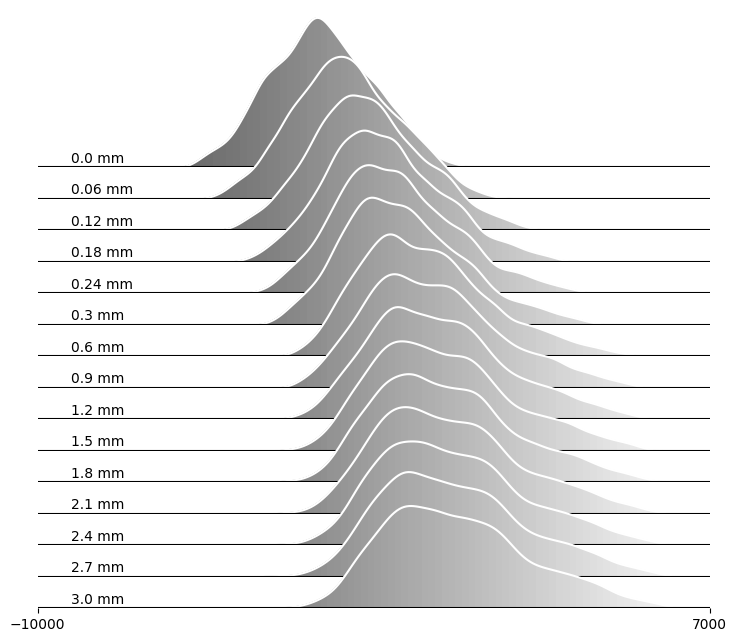

In [134]:
labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.60, 0.90, 1.20, 1.50, 1.80, 2.10, 2.40, 2.70, 3.00]]
plot_img = extracted_rows
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='gray', Range=(-10000, 7000))

In [25]:
G1_q25 = np.load('/host/percy/local_raid/youngeun/myjupyter/array/G1_q25.npy')
G1_q75 = np.load('/host/percy/local_raid/youngeun/myjupyter/array/G1_q75.npy')
G1_q50 = np.load('/host/percy/local_raid/youngeun/myjupyter/array/G1_q50.npy')

In [136]:
q25_expanded = np.tile(G1_q25.reshape(1, -1), (corrected_intensity_profiles.shape[0], 1))
q75_expanded = np.tile(G1_q75.reshape(1, -1), (corrected_intensity_profiles.shape[0], 1))
q50_expanded = np.tile(G1_q50.reshape(1, -1), (corrected_intensity_profiles.shape[0], 1))

In [137]:
BB_q25 = corrected_intensity_profiles * q25_expanded
BB_q75 = corrected_intensity_profiles * q75_expanded
BB_q50 = corrected_intensity_profiles * q50_expanded

In [138]:
BB_q25

array([[   -0.        ,    -0.        , -2279.59762799, ...,
        -3841.0522016 , -4355.70701328, -4319.26894623],
       [   -0.        ,    -0.        , -1753.43194824, ...,
        -3214.49929251, -3821.5068229 , -3716.67713805],
       [   -0.        ,    -0.        , -1241.35392601, ...,
        -2908.18884784, -3405.31822516, -3325.52589822],
       ...,
       [   -0.        ,     0.        ,  1765.04935941, ...,
          743.52684349,   328.99730176,   727.01448359],
       [   -0.        ,     0.        ,  1795.5603714 , ...,
          574.57569639,   317.15853297,   714.29523963],
       [   -0.        ,     0.        ,  1838.19699372, ...,
          641.57219713,   366.26512952,   778.06418241]])

## 25% Lowest

In [141]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
extracted_rows_q25 = BB_q25[rows_to_extract]
print(extracted_rows_q25.shape)

(15, 9684)


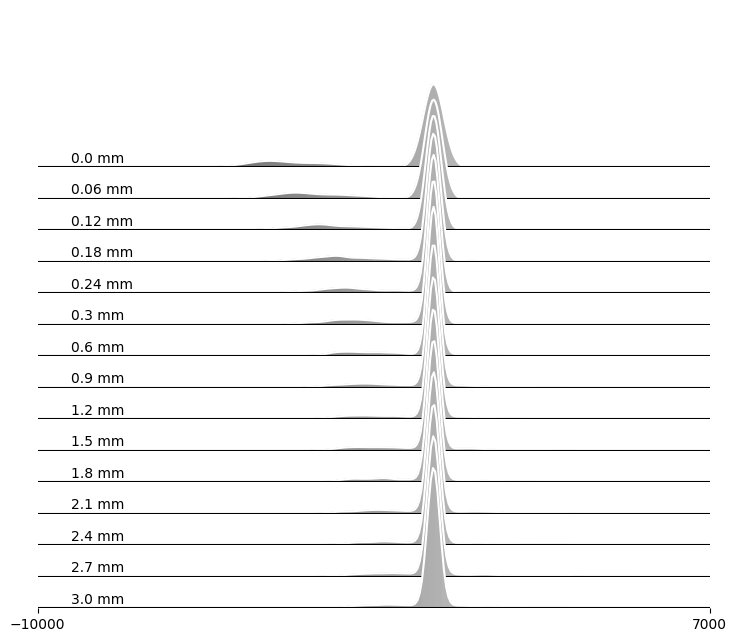

In [159]:
labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.60, 0.90, 1.20, 1.50, 1.80, 2.10, 2.40, 2.70, 3.00]]
plot_img = extracted_rows_q25
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='gray', Range=(-10000, 7000))

## 25% Highest

In [143]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
extracted_rows_q75 = BB_q75[rows_to_extract]
print(extracted_rows_q75.shape)

(15, 9684)


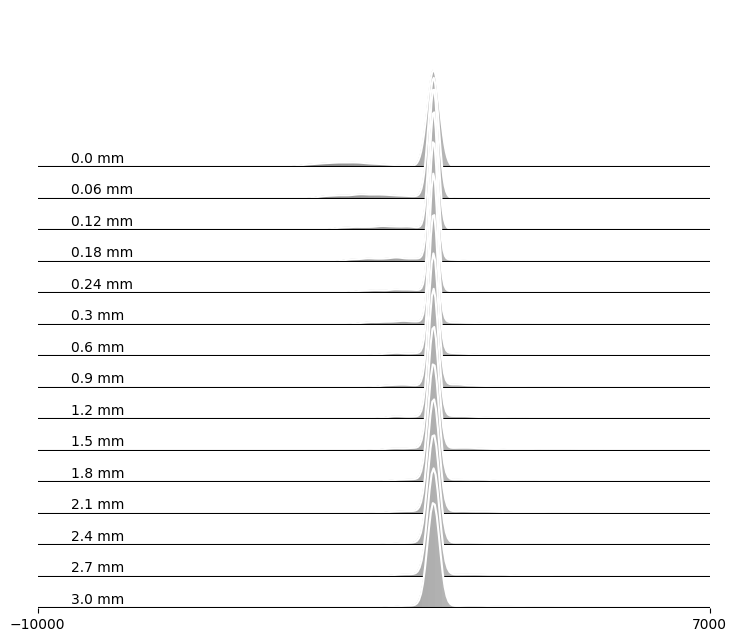

In [158]:
labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.60, 0.90, 1.20, 1.50, 1.80, 2.10, 2.40, 2.70, 3.00]]
plot_img = extracted_rows_q75
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='gray', Range=(-10000, 7000))

## Middle 50%

In [145]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
extracted_rows_q50 = BB_q50[rows_to_extract]
print(extracted_rows_q50.shape)

(15, 9684)


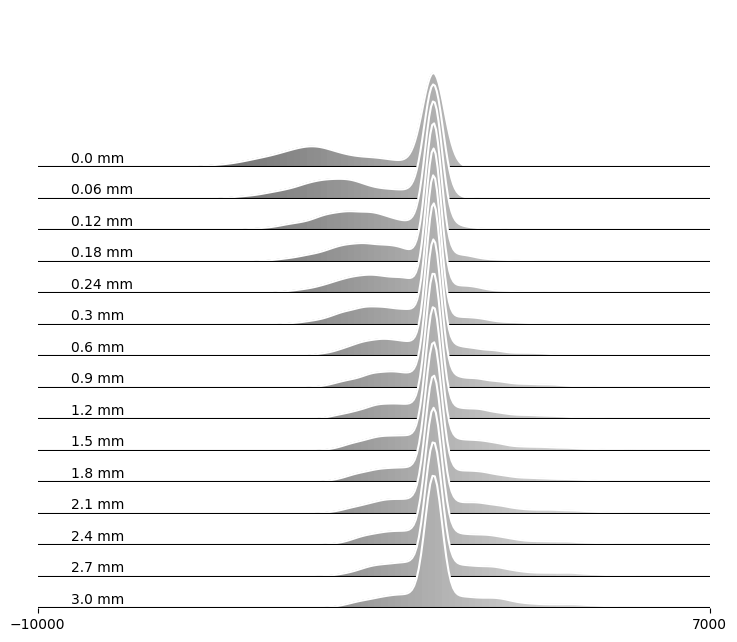

In [157]:
labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.60, 0.90, 1.20, 1.50, 1.80, 2.10, 2.40, 2.70, 3.00]]
plot_img = extracted_rows_q50
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='gray', Range=(-10000, 7000))

In [147]:
q_total = extracted_rows_q25 + extracted_rows_q75 + extracted_rows_q50

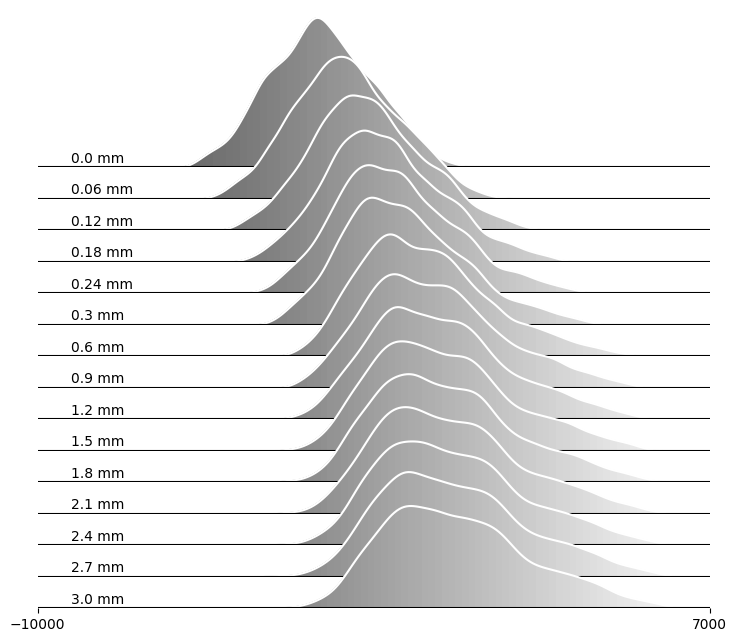

In [156]:
labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.60, 0.90, 1.20, 1.50, 1.80, 2.10, 2.40, 2.70, 3.00]]
plot_img = q_total
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='gray', Range=(-10000, 7000))

### Intensity Profiles of Original data (no regression)

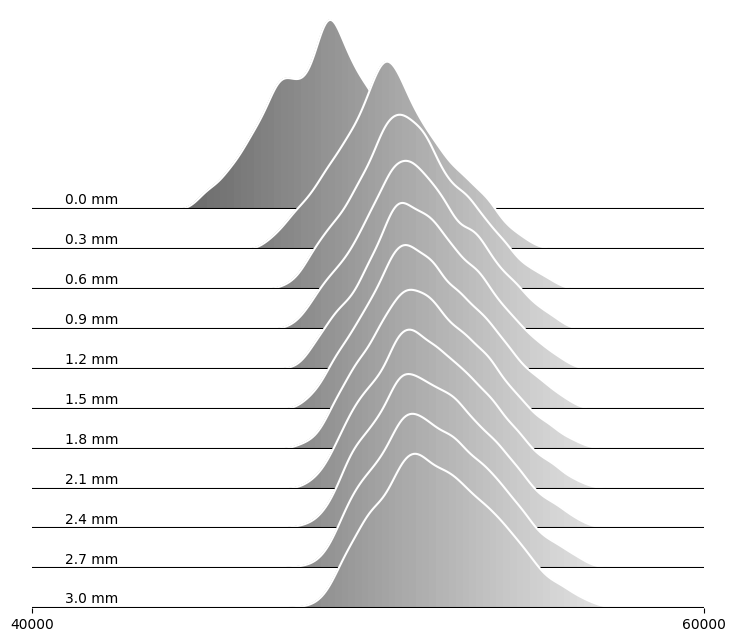

In [23]:
rows_to_extract = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
extracted_map5k = map5k[rows_to_extract]

labels = [str(x)+' mm' for x in [0.00, 0.30, 0.60, 0.90, 1.20, 1.50, 1.80, 2.10, 2.40, 2.70, 3.00]]
plot_img = extracted_map5k
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='gray', Range=(40000, 60000))

In [54]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
extracted_map5k = map5k[rows_to_extract]
print(extracted_map5k.shape)

(15, 9684)


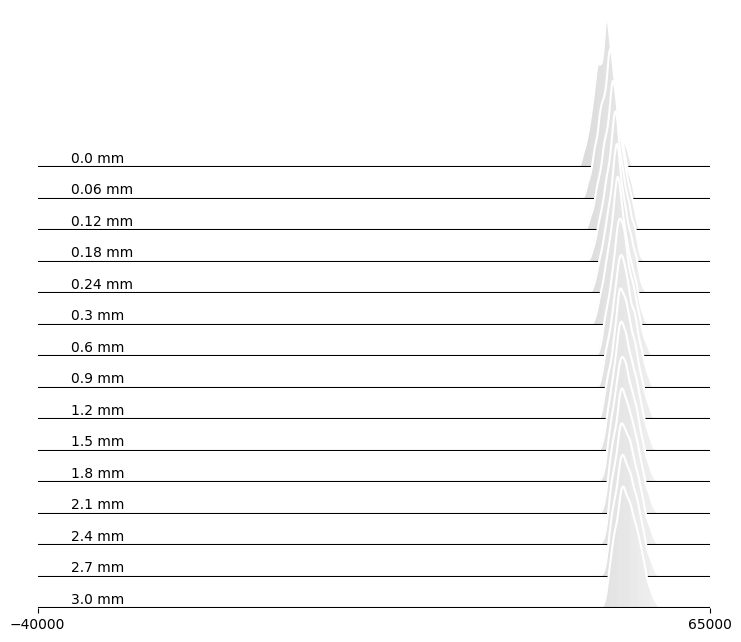

In [57]:
labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.60, 0.90, 1.20, 1.50, 1.80, 2.10, 2.40, 2.70, 3.00]]
plot_img = extracted_map5k
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='gray', Range=(-40000, 65000))

In [26]:
q25_expanded = np.tile(G1_q25.reshape(1, -1), (map5k.shape[0], 1))
q75_expanded = np.tile(G1_q75.reshape(1, -1), (map5k.shape[0], 1))
q50_expanded = np.tile(G1_q50.reshape(1, -1), (map5k.shape[0], 1))

BB_q25 = map5k * q25_expanded
BB_q75 = map5k * q75_expanded
BB_q50 = map5k * q50_expanded

In [38]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
extracted_rows_q25 = BB_q25[rows_to_extract]
print(extracted_rows_q25.shape)

(15, 9684)


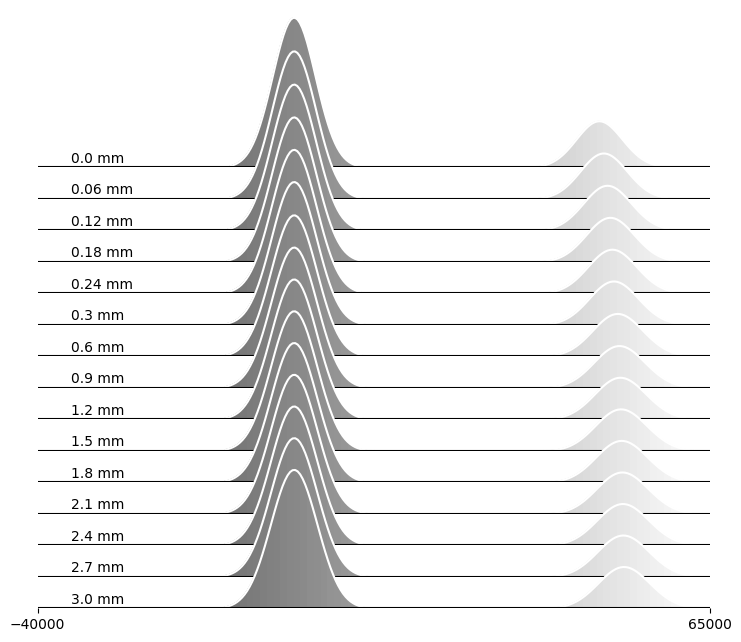

In [48]:
labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.60, 0.90, 1.20, 1.50, 1.80, 2.10, 2.40, 2.70, 3.00]]
plot_img = extracted_rows_q25
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='gray', Range=(-40000, 65000))

In [34]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
extracted_rows_q75 = BB_q75[rows_to_extract]
print(extracted_rows_q75.shape)

(15, 9684)


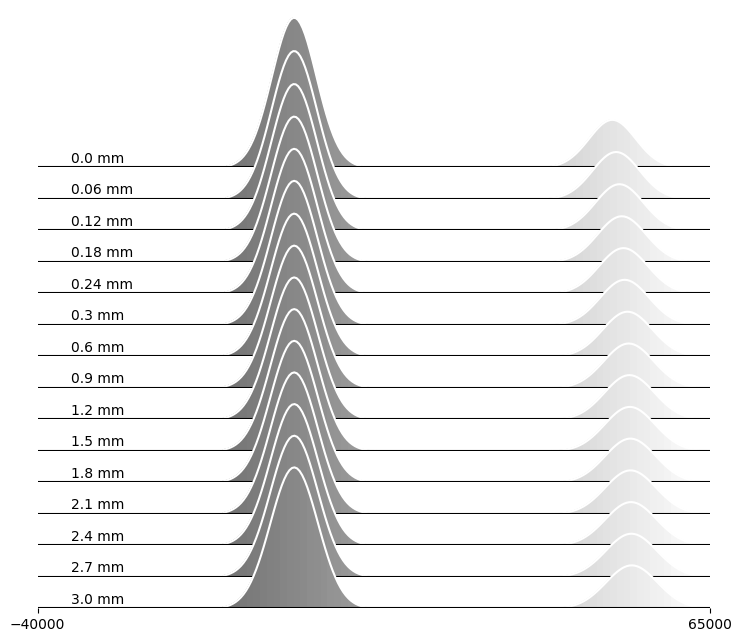

In [49]:
labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.60, 0.90, 1.20, 1.50, 1.80, 2.10, 2.40, 2.70, 3.00]]
plot_img = extracted_rows_q75
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='gray', Range=(-40000, 65000))

In [36]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
extracted_rows_q50 = BB_q50[rows_to_extract]
print(extracted_rows_q50.shape)

(15, 9684)


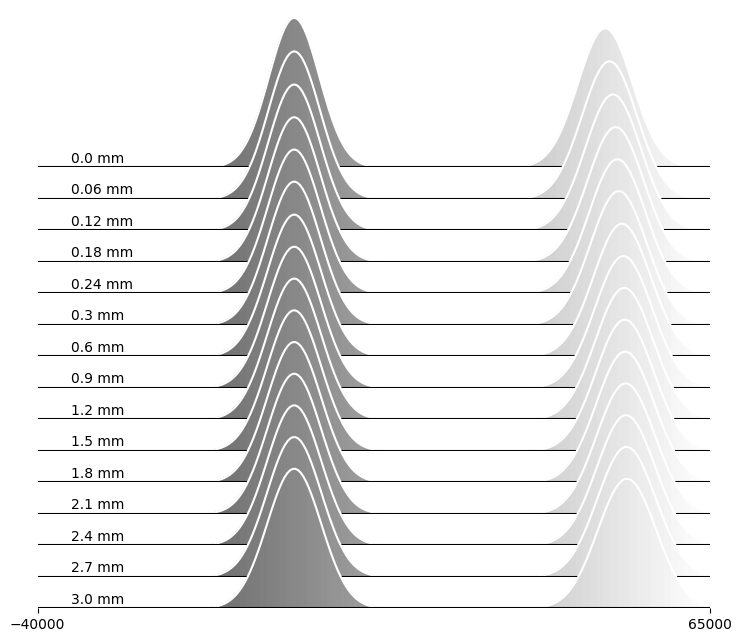

In [50]:
labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.60, 0.90, 1.20, 1.50, 1.80, 2.10, 2.40, 2.70, 3.00]]
plot_img = extracted_rows_q50
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='gray', Range=(-40000, 65000))

## MPC calculation

In [9]:
import os
import glob
import scipy.stats
from brainspace.mesh.mesh_io import read_surface
from brainspace.plotting import plot_hemispheres
from brainspace.gradient import GradientMaps
from brainspace.mesh.array_operations import smooth_array
import seaborn as sns

# Path to MICAPIPE
micapipe=os.popen("echo $MICAPIPE").read()[:-1]

# Load native mid surface
inf_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
inf_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')
mask_lh =  nb.load(micapipe + '/surfaces/fsLR-5k.R.mask.shape.gii').darrays[0].data
mask_rh =  nb.load(micapipe + '/surfaces/fsLR-5k.L.mask.shape.gii').darrays[0].data
mask_5k = np.concatenate((mask_lh, mask_rh), axis=0)

# Labels and boolean mask
mask_surf = mask_5k != 0

# Environment variables
surf='fsLR-5k'
out_maps='/host/percy/local_raid/youngeun/LONI/LPBA40.AIR.nifti/JHU-ICBM-SWM/noFA_SWM'
out_surf='/host/percy/local_raid/youngeun/LONI/LPBA40.AIR.nifti/JHU-ICBM-SWM/I_figured_out_SWM/rawdata/micapipe_v0.2.0/sub-MNI152/surf'

# Load MNI white matter surface
MNI_wmL = read_surface(f'{out_surf}/sub-MNI152_hemi-L_space-nativepro_surf-{surf}_label-white.surf.gii', itype='gii')
MNI_wmR = read_surface(f'{out_surf}/sub-MNI152_hemi-R_space-nativepro_surf-{surf}_label-white.surf.gii', itype='gii')

# Load spheres fsLR5k
sphere_lh = read_surface(micapipe+'/surfaces/fsLR-5k.L.sphere.surf.gii', itype='gii')
sphere_rh = read_surface(micapipe+'/surfaces/fsLR-5k.R.sphere.surf.gii', itype='gii')
# Inflate the INFLATED surface 10% reference to the sphere
ws_lh, ws_rh = inflate_surf(MNI_wmL, MNI_wmR, sphere_lh, sphere_rh, W=0.1)

# Function to build the MPC from an intencity profile
def build_mpc(data, mask):
    # If no parcellation is provided, MPC will be computed vertexwise
    I = data

    # Calculate mean across columns, excluding mask and any excluded labels input
    I_M = np.nanmean(np.float32(np.where(mask, I, np.nan)), axis=1)

    # Get residuals of all columns (controlling for mean)
    I_resid = np.zeros(I.shape)
    for c in range(I.shape[1]):
        y = I[:,c]
        x = I_M
        slope, intercept, _, _, _ = scipy.stats.linregress(x,y)
        y_pred = intercept + slope*x
        I_resid[:,c] = y - y_pred

    # Calculate correlation coefficient of the intesities with residuals
    R = np.corrcoef(I_resid, rowvar=False)

    # Log transform
    MPC = 0.5 * np.log( np.divide(1 + R, 1 - R) )
    MPC[np.isnan(MPC)] = 0
    MPC[np.isinf(MPC)] = 0

    # CLEANUP: correct diagonal and round values to reduce file size
    # Replace all values in diagonal by zeros to account for floating point error
    for i in range(0,MPC.shape[0]):
            MPC[i,i] = 0
    
    # Output MPC, microstructural profiles, and problem nodes
    return (MPC)

# Create the gradients from the MPC matrix
def mpc_dm(MPC, mpc_mask, Ngrad=3, kernel=None, sparsity=0.9):
    # Cleanup before diffusion embeding
    MPC[~np.isfinite(MPC)] = 0
    MPC[np.isnan(MPC)] = 0
    MPC[MPC==0] = np.finfo(float).eps

    # Get the index of the non medial wall regions
    indx = np.where(mpc_mask==1)[0]

    # Slice the matrix
    MPC_masked = MPC[indx, :]
    MPC_masked = MPC_masked[:, indx]
    MPC_masked.shape

    # Calculate the gradients
    MPCgm = GradientMaps(n_components=Ngrad, random_state=None, approach='dm', kernel=kernel)
    MPCgm.fit(MPC_masked, sparsity=sparsity)
    
    # Map gradients to surface
    grad = [None] * Ngrad
    for i, g in enumerate(MPCgm.gradients_.T[0:Ngrad,:]):
        # create a new array filled with NaN values
        g_nan = np.full(mask_surf.shape, np.nan)
        g_nan[indx] = g

        # fill in the calculated values into the corresponding indices of the new array
        grad[i] = g_nan
    
    return(MPCgm, grad)

## SWM gradients from the BB

In [131]:
# Labels and boolean mask
#MPC = build_mpc(corrected_intensity_profiles, mask_surf) # compute MPC
MPC = build_mpc(map5k, mask_surf) # compute MPC

/tmp/ipykernel_3733912/4174464588.py:59: RuntimeWarning: divide by zero encountered in divide
  MPC = 0.5 * np.log( np.divide(1 + R, 1 - R) )


In [132]:
# Calculate the gradients
Ngrad=5
MPC_all, grad = mpc_dm(MPC, mask_surf, Ngrad=Ngrad, kernel='cosine', sparsity=0.99)

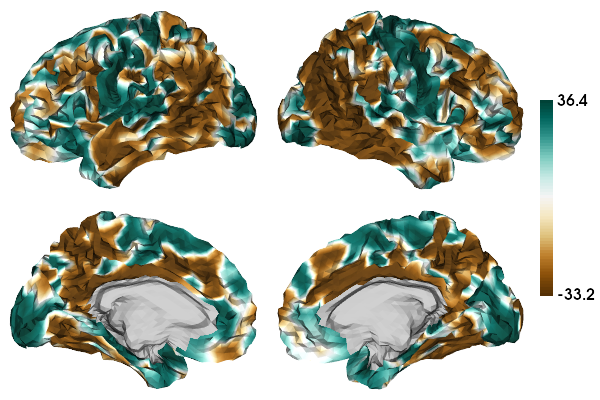

In [133]:
import cmocean

# Load MNI white matter surface
MNI_wmL = read_surface(f'{out_surf}/sub-MNI152_hemi-L_space-nativepro_surf-{surf}_label-white.surf.gii', itype='gii')
MNI_wmR = read_surface(f'{out_surf}/sub-MNI152_hemi-R_space-nativepro_surf-{surf}_label-white.surf.gii', itype='gii')

# plot the gradients
plot_hemispheres(MNI_wmL, MNI_wmR, array_name=grad[0], cmap='BrBG', size=(600, 400), zoom=1.6, embed_nb=True, 
                 interactive=False, share='both',
                 nan_color=(0.7, 0.7, 0.7, 1), transparent_bg=True, color_bar='right', layout_style='grid')

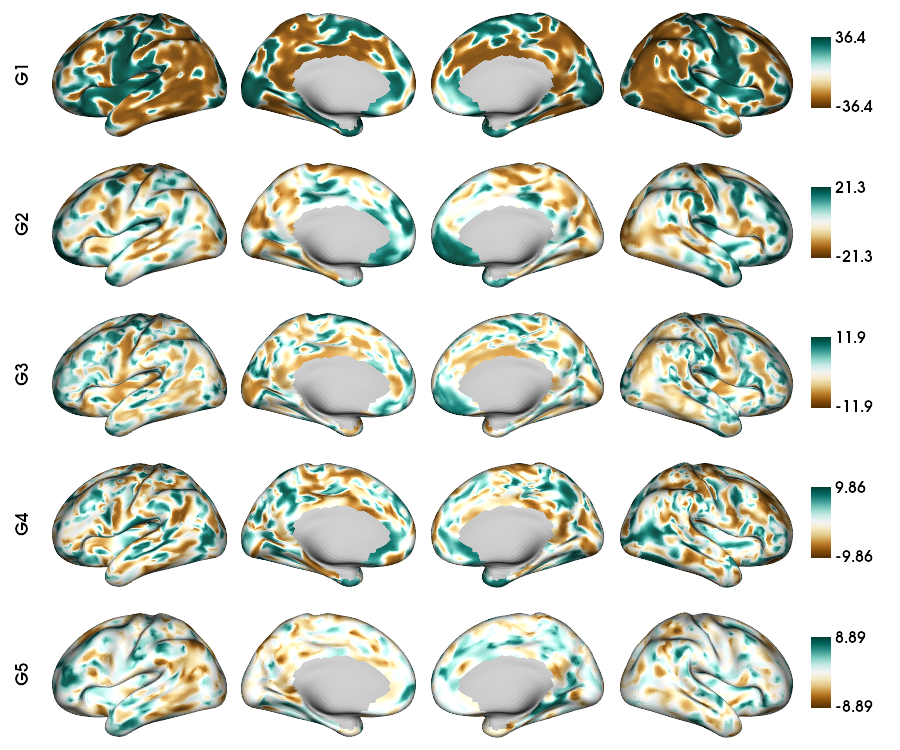

In [134]:
# plot the gradients
labels=['G'+str(x) for x in list(range(1,Ngrad+1))]
plot_hemispheres(inf_lh, inf_rh, array_name=grad, cmap='BrBG', nan_color=(0.7, 0.7, 0.7, 1),
  zoom=1.5, size=(900, 750), embed_nb=True, color_range = 'sym',
  color_bar='right', label_text={'left': labels}, screenshot=False)

# Plot of the variance explained by each eigen value

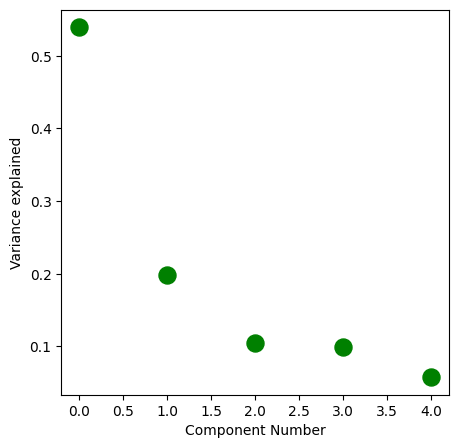

In [140]:
fig, ax = plt.subplots(1, figsize=(5, 5))

var_explained = MPC_all.lambdas_ / np.sum(MPC_all.lambdas_)
ax.scatter(range(MPC_all.lambdas_.size), var_explained, s=150, c='green')
ax.set_xlabel('Component Number')
ax.set_ylabel('Variance explained')

plt.show()

# Scatter plot of the first three eigen values 

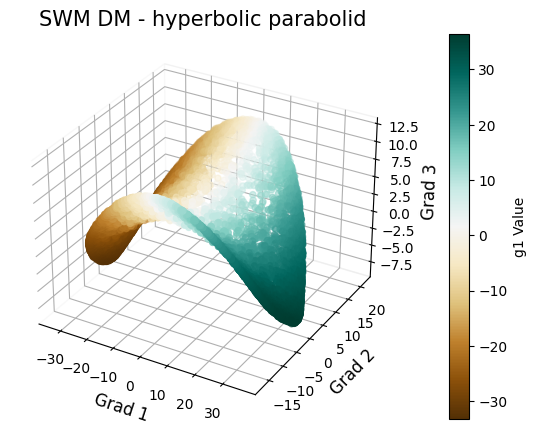

In [207]:
# Plot the gradients
g1 = MPC_all.gradients_[:, 0]
g2 = MPC_all.gradients_[:, 1]
g3 = MPC_all.gradients_[:, 2]
g4 = MPC_all.gradients_[:, 4]

# 그래프 생성
fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection="3d")

# 산점도 생성 'c' changes the color of the dots
sc = ax.scatter3D(g1, g2, g3, c=g1, cmap='BrBG')

# 컬러바 추가
cb = plt.colorbar(sc, ax=ax, pad=0.1)
cb.set_label('g1 Value')

# 제목과 축 레이블 설정
plt.title("SWM DM - hyperbolic parabolid", fontsize=15)
ax.set_xlabel('Grad 1', fontsize=12)
ax.set_ylabel('Grad 2', fontsize=12)
ax.set_zlabel('Grad 3', fontsize=12)

# 외부 상자선 제거
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# 그래프 표시
plt.show()

## BigBrain SWM DM eigenvector 1 distribution

/tmp/ipykernel_3733912/2554628204.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  BrBG = cm.get_cmap('BrBG')


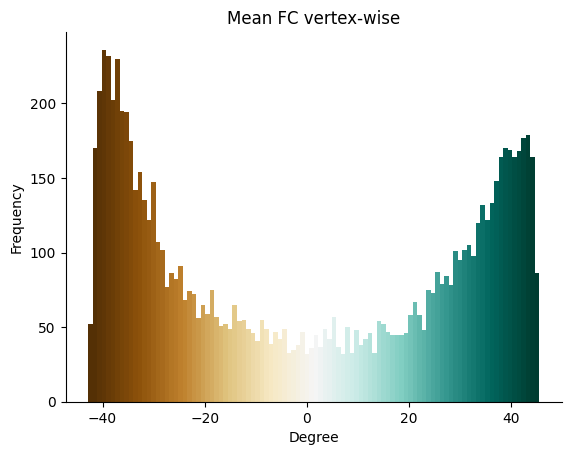

In [87]:
# Remove NaN from the variance
var_ft = g1[~np.isnan(g1)]
n, bins = np.histogram(var_ft, bins=100)  # Compute the histogram data
bin_centers = (bins[:-1] + bins[1:]) / 2  # Compute the bin centers

# Use Seaborn's 'mako' colormap
#cmap = sns.color_palette("mako", as_cmap=True)
# BrBG 컬러맵 가져오기
BrBG = cm.get_cmap('BrBG')
colored_bins = BrBG(np.interp(bin_centers, [np.quantile(g1, 0.01), 
                                            np.quantile(g1, 0.99)], [0, 1]))

# Create a figure with a transparent background
fig, ax = plt.subplots()
fig.patch.set_alpha(0.0)  # Set the background of the figure to be transparent
ax.patch.set_alpha(0.0)  # Set the background of the axes to be transparent

# Plot the histogram with the desired colormap
plt.bar(bin_centers, n, width=np.diff(bins), color=colored_bins, alpha=1)

# Remove upper and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Customize ticks and labels
plt.xlabel('Degree', fontsize=10)  # Increase font size for x-label
plt.ylabel('Frequency', fontsize=10)  # Increase font size for y-label
plt.title('Mean FC vertex-wise', fontsize=12)  # Increase font size for title

plt.show()

In [112]:
# standard deviation
sd = 1

# 0보다 작은 값들 추출
g1_neg = g1[g1 < 0]

# 0보다 작은 값들의 평균과 표준 편차 계산
mean_neg = np.mean(g1_neg)
std_neg = np.std(g1_neg)

# 0보다 작은 값들 중에서 평균의 1.6 표준 편차 이내에 있는 값들의 이진 벡터 생성
g1_nb = np.zeros(grad[0].shape, dtype=int)  # 초기 이진 벡터
g1_nb[(grad[0] < 0) & (grad[0] >= mean_neg - sd * std_neg) & (grad[0] <= mean_neg + sd * std_neg)] = 1

# 0보다 큰 값들 추출
g1_pos = g1[g1 > 0]

# 0보다 큰 값들의 평균과 표준 편차 계산
mean_pos = np.mean(g1_pos)
std_pos = np.std(g1_pos)

# 0보다 큰 값들 중에서 평균의 1.6 표준 편차 이내에 있는 값들의 이진 벡터 생성
g1_pb = np.zeros(grad[0].shape, dtype=int)  # 초기 이진 벡터
g1_pb[(grad[0] > 0) & (grad[0] >= mean_pos - sd * std_pos) & (grad[0] <= mean_pos + sd * std_pos)] = 1

# 결과 확인
print("Array pos:", g1_pb)
print("Array neg:", g1_nb)

Array pos: [0 0 0 ... 0 0 0]
Array neg: [0 1 0 ... 1 0 1]


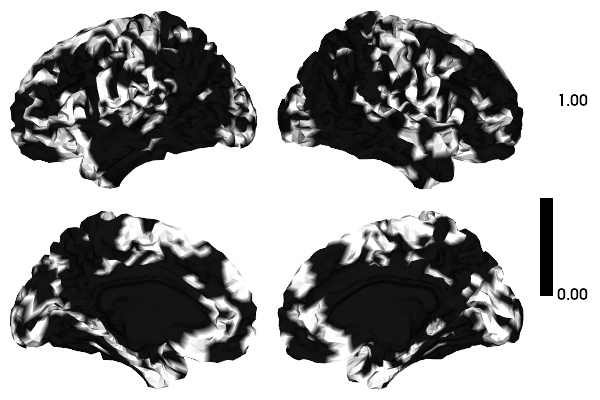

In [116]:
# plot the gradients
plot_hemispheres(MNI_wmL, MNI_wmR, array_name=g1_pb, cmap='gray', size=(600, 400), zoom=1.6, embed_nb=True, 
                 interactive=False, share='both',
                 nan_color=(0.7, 0.7, 0.7, 1), transparent_bg=True, color_bar='right', layout_style='grid')

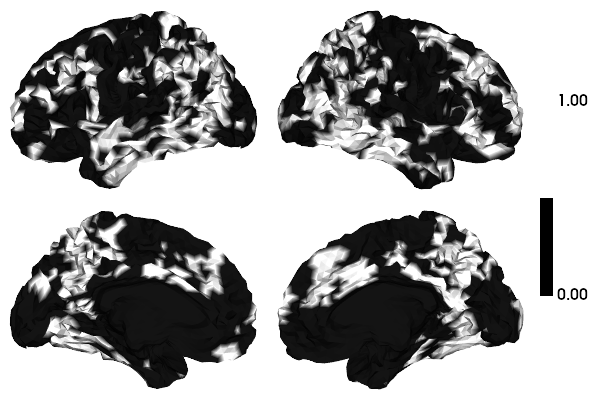

In [117]:
# plot the gradients
plot_hemispheres(MNI_wmL, MNI_wmR, array_name=g1_nb, cmap='gray', size=(600, 400), zoom=1.6, embed_nb=True, 
                 interactive=False, share='both',
                 nan_color=(0.7, 0.7, 0.7, 1), transparent_bg=True, color_bar='right', layout_style='grid')

# Plot of the SWM BigBrain intensity profiles 
## Profiles of the positive and negative peaks of G1

In [144]:
map5k.shape

(51, 9684)

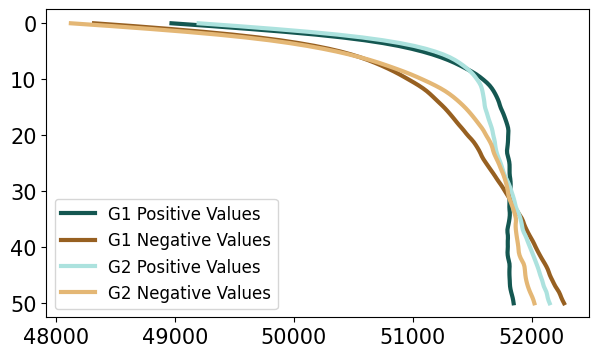

In [252]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# g1_pb, g1_nb에서 1인 부분만 추출하여 mean profile 계산
filtered_profiles_pb = np.where(g1_pb == 1, map5k, np.nan)
filtered_profiles_nb = np.where(g1_nb == 1, map5k, np.nan)
filtered_profiles_pb2 = np.where(g2_pb == 1, map5k, np.nan)
filtered_profiles_nb2 = np.where(g2_nb == 1, map5k, np.nan)

# 행별 평균 값 계산 (NaN 제외)
mean_profiles_pb = np.nanmean(filtered_profiles_pb, axis=1)
mean_profiles_nb = np.nanmean(filtered_profiles_nb, axis=1)
mean_profiles_pb2 = np.nanmean(filtered_profiles_pb2, axis=1)
mean_profiles_nb2 = np.nanmean(filtered_profiles_nb2, axis=1)

# Plot
plt.figure(figsize=(7, 4))

# 부드러운 프로파일 계산
x_values = np.arange(mean_profiles_pb.shape[0])
x_interp = np.linspace(0, len(mean_profiles_pb) - 1, 100)

# g1_pb, g1_nb에 대한 인터폴레이션
f_pb = interp1d(x_values, mean_profiles_pb, kind='quadratic', fill_value="extrapolate")
y_interp_pb = f_pb(x_interp)

f_nb = interp1d(x_values, mean_profiles_nb, kind='quadratic', fill_value="extrapolate")
y_interp_nb = f_nb(x_interp)

# g2_pb, g2_nb에 대한 인터폴레이션
f_pb2 = interp1d(x_values, mean_profiles_pb2, kind='quadratic', fill_value="extrapolate")
y_interp_pb2 = f_pb2(x_interp)

f_nb2 = interp1d(x_values, mean_profiles_nb2, kind='quadratic', fill_value="extrapolate")
y_interp_nb2 = f_nb2(x_interp)

# 사용자 정의 색상 (RGB)
color_pb = (20 / 255, 87 / 255, 81 / 255)      # 파란색
color_nb = (151 / 255, 96 / 255, 33 / 255)     # 오렌지색
color_pb2 = (172 / 255, 226 / 255, 222 / 255)  # 밝은 청록색
color_nb2 = (228 / 255, 183 / 255, 117 / 255)  # 밝은 갈색

# Line plot
lw=3
plt.plot(y_interp_pb, x_interp, color=color_pb, linewidth=lw, label='G1 Positive Values')
plt.plot(y_interp_nb, x_interp, color=color_nb, linewidth=lw, label='G1 Negative Values')
plt.plot(y_interp_pb2, x_interp, color=color_pb2, linewidth=lw, label='G2 Positive Values')
plt.plot(y_interp_nb2, x_interp, color=color_nb2, linewidth=lw, label='G2 Negative Values')

# x축 뒤집기
plt.gca().invert_yaxis()

# 설정
plt.legend(fontsize=12)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

# 플롯 보여주기
plt.show()


In [230]:
def plot_ridgeplot(matrix, matrix_df=None, Cmap='rocket', Range=(2.5, 4.5), Xlab="flair", save_path=None, title=None, single_color=None, single_color_alpha=0.5):
    import numpy as np
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    import matplotlib as mpl

    # Ensure alpha is within the valid range
    if single_color_alpha < 0 or single_color_alpha > 1:
        raise ValueError("single_color_alpha must be between 0 and 1")

    # Prepare the data
    ai = matrix.flatten()
    subject = np.array([])
    id_x = np.array([])

    for i in range(matrix.shape[0]):
        label = np.array([str(i+1) for j in range(matrix.shape[1])])
        subject = np.concatenate((subject, label))
        id_label = np.array([matrix_df[i] for j in range(matrix.shape[1])])
        id_x = np.concatenate((id_x, id_label))

    d = {'feature': ai,
         'subject': subject,
         'id_x': id_x
        }
    df = pd.DataFrame(d)

    # Set up the plot
    f, axs = plt.subplots(nrows=matrix.shape[0], figsize=(3.468504*2.5, 2.220472*3.5), sharex=True, sharey=True)
    f.set_facecolor('none')

    x = np.linspace(Range[0], Range[1], 100)

    for i, ax in enumerate(axs, 1):
        sns.kdeplot(df[df["subject"]==str(i)]['feature'],
                    fill=True,
                    color="w",  # Set edge color to gray
                    alpha=0.25,
                    linewidth=1.5,
                    legend=False,  # Ensure legend is not included
                    ax=ax)
        
        ax.set_xlim(Range[0], Range[1])
        
        if single_color:
            color = single_color
        else:
            color = Cmap
        
        if single_color:
            # Apply single color with specified alpha
            im = ax.imshow(np.vstack([x, x]),
                           cmap=None,
                           aspect="auto",
                           extent=[*ax.get_xlim(), *ax.get_ylim()],
                           vmin=0, vmax=1)  # Use dummy values for vmin and vmax
            im.set_cmap(None)
            # Create RGBA color with specified alpha
            rgba_color = mpl.colors.to_rgba(single_color, alpha=single_color_alpha)
            im.set_array(np.array([[0.5]] * len(x)))  # Use a constant array for coloring
            im.set_cmap(mpl.colors.ListedColormap([rgba_color]))
        else:
            # Use the colormap
            im = ax.imshow(np.vstack([x, x]),
                           cmap=Cmap,
                           aspect="auto",
                           extent=[*ax.get_xlim(), *ax.get_ylim()]
                          )
        
        ax.collections
        path = ax.collections[0].get_paths()[0]
        patch = mpl.patches.PathPatch(path, transform=ax.transData)
        im.set_clip_path(patch)
           
        ax.spines[['left','right','bottom','top']].set_visible(False)
        
        if i != matrix.shape[0]:
            ax.tick_params(axis="x", length=0)
        else:
            ax.set_xlabel(Xlab)
            
        ax.set_yticks([])
        ax.set_ylabel("")
        
        ax.axhline(0, color="black")

        ax.set_facecolor("none")
        
        # Remove x-axis ticks and labels
        ax.set_xticks([])  # Remove x-axis ticks
        ax.set_xticklabels([])  # Remove x-axis tick labels

    # Removed the ax.text line to eliminate labels on the plot
    # ax.text(0.05, 0.01, matrix_df[i], transform=ax.transAxes, fontsize=10, color='black', ha='left', va='bottom')

    plt.subplots_adjust(hspace=-0.8)
    
    if title:
        plt.suptitle(title, y=0.99, fontsize=16)

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    else:
        plt.show()


In [242]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 20, 30, 40, 50]
extracted_rows = filtered_profiles_pb[rows_to_extract]
print(extracted_rows.shape)

(14, 9684)


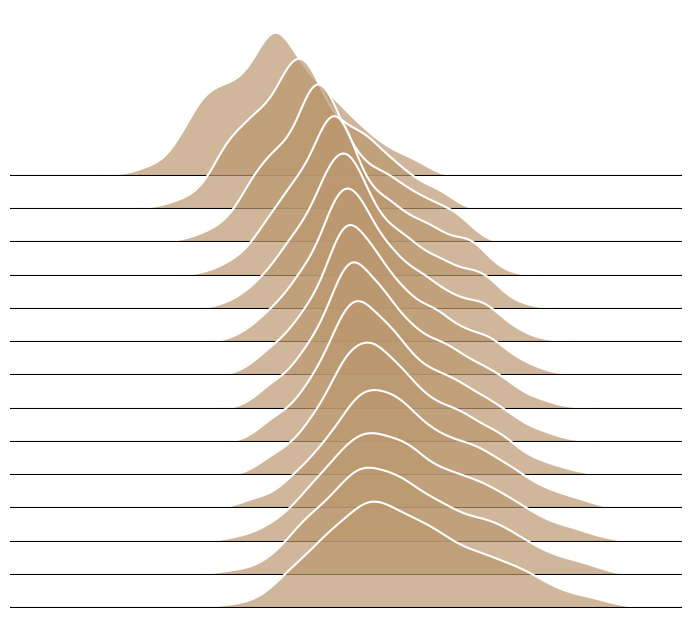

In [243]:
labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.36, 0.42, 0.48, 0.60, 1.20, 1.80, 2.40, 3.00]]
plot_img = extracted_rows
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='viridis', Range=(43000, 58000), single_color=color_pb, single_color_alpha=0.6)

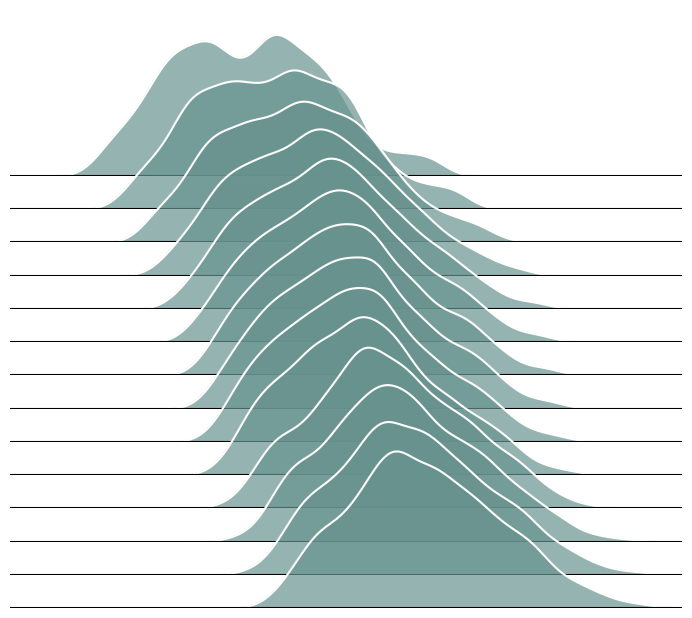

In [237]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 20, 30, 40, 50]
extracted_rows = filtered_profiles_nb[rows_to_extract]

labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.36, 0.42, 0.48, 0.60, 1.20, 1.80, 2.40, 3.00]]
plot_img = extracted_rows
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='viridis', Range=(43000, 58000), single_color=color_nb, single_color_alpha=0.6)

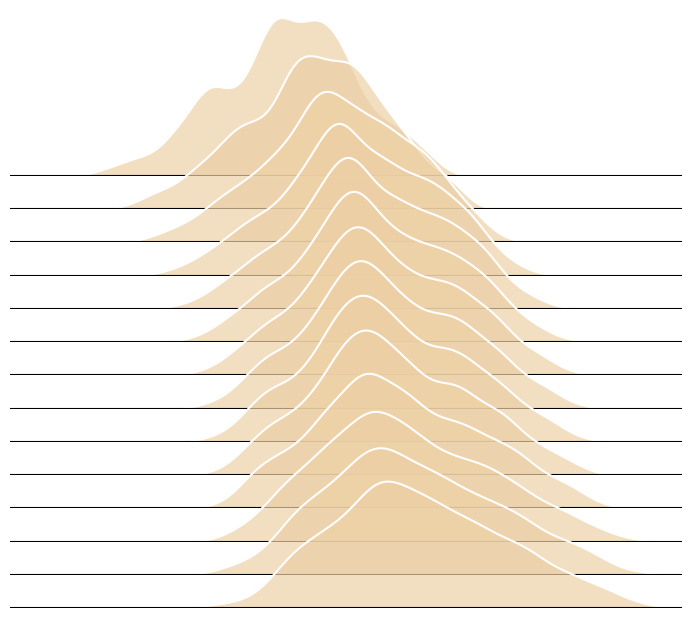

In [239]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 20, 30, 40, 50]
extracted_rows = filtered_profiles_pb2[rows_to_extract]

labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.36, 0.42, 0.48, 0.60, 1.20, 1.80, 2.40, 3.00]]
plot_img = extracted_rows
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='viridis', Range=(43000, 58000), single_color=color_pb2, single_color_alpha=0.6)

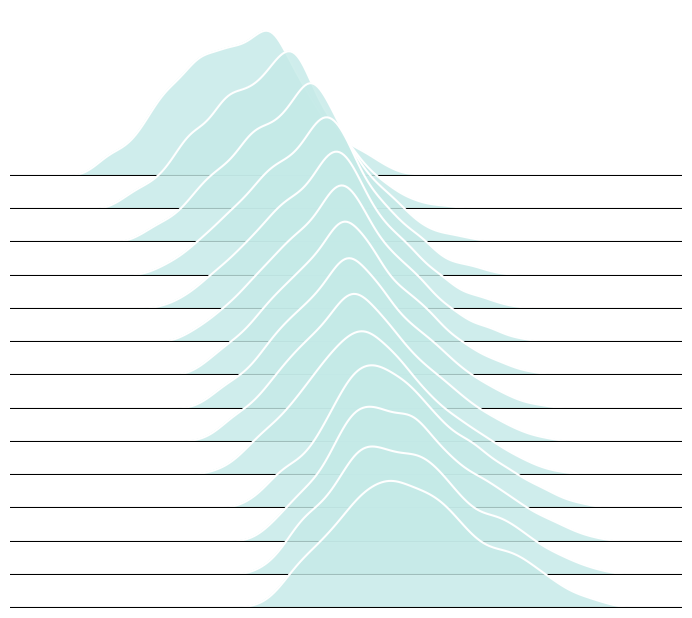

In [241]:
rows_to_extract = [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 20, 30, 40, 50]
extracted_rows = filtered_profiles_nb2[rows_to_extract]

labels = [str(x)+' mm' for x in [0.00, 0.06, 0.12, 0.18, 0.24, 0.30, 0.36, 0.42, 0.48, 0.60, 1.20, 1.80, 2.40, 3.00]]
plot_img = extracted_rows
plot_img[:, mask_5k == False] = np.nan

# Identify rows with NaN values and exclude them
valid_rows = ~np.isnan(plot_img).any(axis=0)
plot_img = plot_img[:, valid_rows]

plot_ridgeplot(matrix=plot_img, matrix_df=labels, Cmap='viridis', Range=(43000, 58000), single_color=color_nb2, single_color_alpha=0.75)

In [35]:
from collections import Counter

counter = Counter(grad[0])
most_common_value, most_common_count = most_common_values[0]
second_most_common_value, second_most_common_count = most_common_values[1]

In [36]:
print(most_common_value)
print(second_most_common_value)

20.053064610117925
-15.399397014986876


/data/mica1/03_projects/youngeun/venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/gradient/embedding.py:70: UserWarning: Affinity is not symmetric. Making symmetric.
  warnings.warn('Affinity is not symmetric. Making symmetric.')
/data/mica1/03_projects/youngeun/venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/gradient/embedding.py:77: UserWarning: Graph is not fully connected.
  warnings.warn('Graph is not fully connected.')


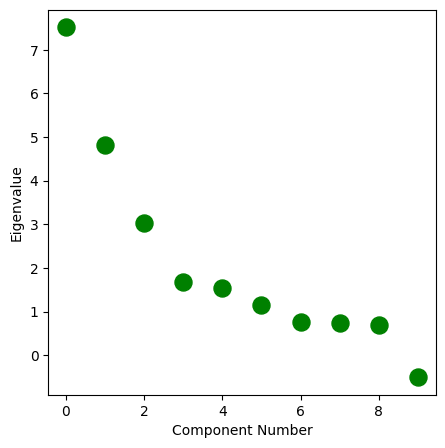

In [37]:
from brainspace.gradient import GradientMaps

# Ask for 10 gradients (default)
gm = GradientMaps(n_components=10, random_state=0)
gm.fit(MPC)

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, figsize=(5, 5))
ax.scatter(range(gm.lambdas_.size), gm.lambdas_, s=150, c='green')
ax.set_xlabel('Component Number')
ax.set_ylabel('Eigenvalue')

plt.show()

In [15]:
#np.save('/host/percy/local_raid/youngeun/myjupyter/array/BB_SWM_G1.npy', grad[0])
np.save('/host/percy/local_raid/youngeun/myjupyter/array/BB_SWM_G1_noregress.npy', grad[0])

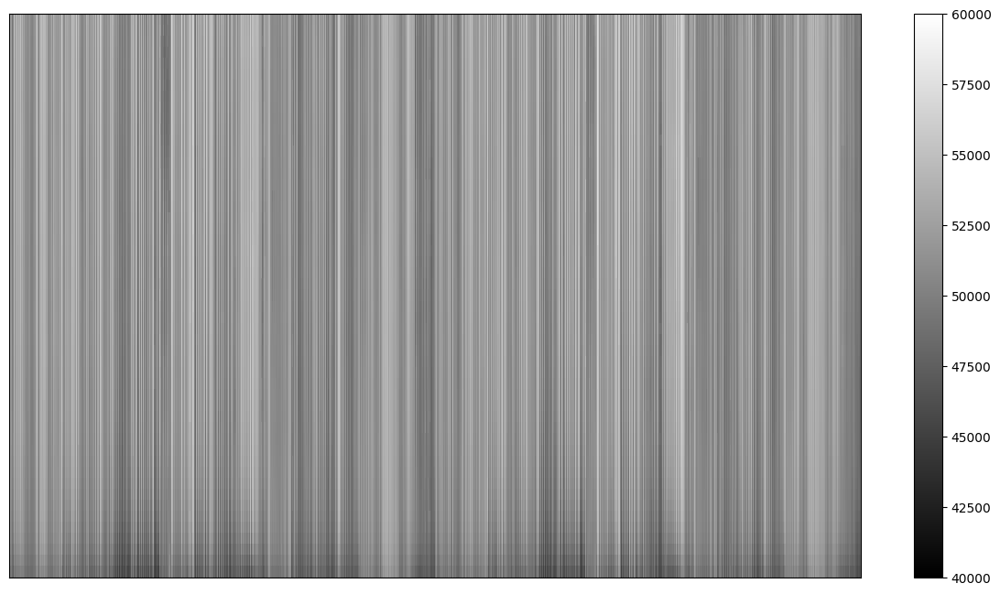

In [250]:
# Identify rows with NaN values and exclude them
data = map5k
data[:, mask_5k == False] = np.nan
valid_rows = ~np.isnan(data).any(axis=0)
data_sliced = data[:, valid_rows]

# Adjust the figure size as per your requirement
plt.figure(figsize=(15, 8))  # Adjust the values (width, height) as needed

# COlor range
xlim = [40000,60000]

# Plot the pcolormesh
pcm = plt.pcolormesh(data_sliced, cmap='gray', shading='auto', vmin = xlim[0], vmax = xlim[1])

# Set labels
#plt.xlabel('Vertices')
plt.xticks([])
plt.yticks([])  # Remove y-axis labels

cbar = plt.colorbar(pcm)

plt.show()

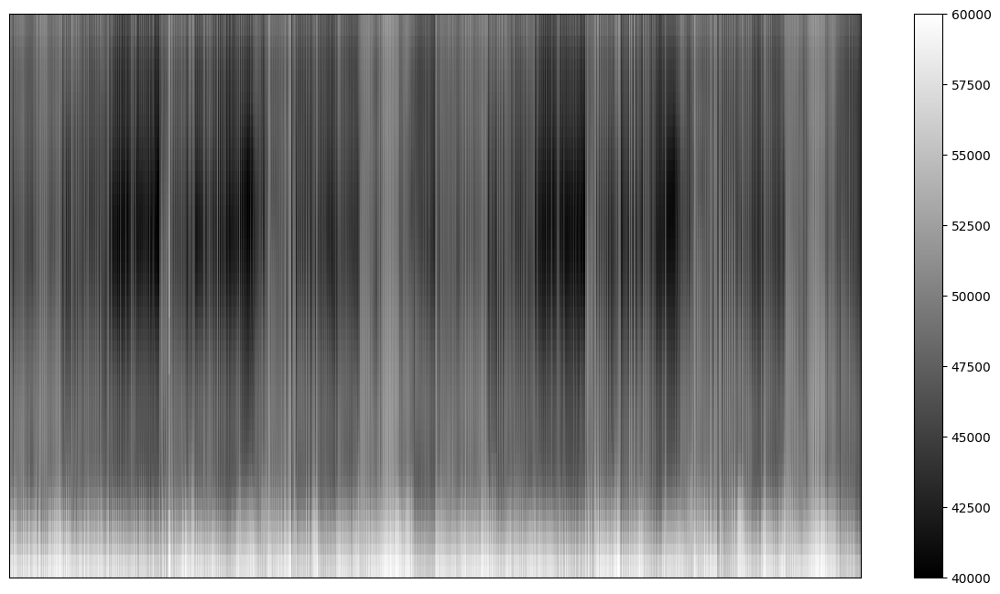

In [251]:
# Identify rows with NaN values and exclude them
data = cmap5k
data[:, mask_5k == False] = np.nan
valid_rows = ~np.isnan(data).any(axis=0)
data_sliced = data[:, valid_rows]

# Adjust the figure size as per your requirement
plt.figure(figsize=(15, 8))  # Adjust the values (width, height) as needed

# COlor range
xlim = [40000,60000]

# Plot the pcolormesh
pcm = plt.pcolormesh(data_sliced, cmap='gray', shading='auto', vmin = xlim[0], vmax = xlim[1])

# Set labels
#plt.xlabel('Vertices')
plt.xticks([])
plt.yticks([])  # Remove y-axis labels

cbar = plt.colorbar(pcm)

plt.show()

## Blade-like SWM atlas

In [147]:
# Environment variables
surf='fsLR-5k'
out_maps='/host/percy/local_raid/youngeun/LONI/LPBA40.AIR.nifti/JHU-ICBM-SWM/noFA_SWM'
out_surf='/host/percy/local_raid/youngeun/LONI/LPBA40.AIR.nifti/JHU-ICBM-SWM/I_figured_out_SWM/rawdata/micapipe_v0.2.0/sub-MNI152/surf'

# Load MNI white matter surface
MNI_wmL = read_surface(f'{out_surf}/sub-MNI152_hemi-L_space-nativepro_surf-{surf}_label-white.surf.gii', itype='gii')
MNI_wmR = read_surface(f'{out_surf}/sub-MNI152_hemi-R_space-nativepro_surf-{surf}_label-white.surf.gii', itype='gii')

# Load blade metric
bladesL =  nb.load(f'{out_maps}/MNI152_hemi-L_surf-{surf}_label-white_atlas-blades.shape.gii').darrays[0].data
bladesR =  nb.load(f'{out_maps}/MNI152_hemi-L_surf-{surf}_label-white_atlas-blades.shape.gii').darrays[0].data
blades = np.concatenate((bladesL, bladesR), axis=0)

### Resample the labels

In [148]:
for i in range(len(blades)):

    if blades[i] == 21:
        blades[i] = 1
    elif blades[i] == 23:
        blades[i] = 2
    elif blades[i] == 25 or blades[i] == 29 or blades[i] == 31 or blades[i] == 33:
        blades[i] = 3
    elif blades[i] == 27:
        blades[i] = 4
    elif blades[i] == 41:
        blades[i] = 5
    elif blades[i] == 43 or blades[i] == 49:
        blades[i] = 6
    elif blades[i] == 45 or blades[i] == 47 or blades[i] == 81:
        blades[i] = 7
    elif blades[i] == 61 or blades[i] == 63 or blades[i] == 65 or blades[i] == 67 or blades[i] == 89:
        blades[i] = 8
    elif blades[i] == 83 or blades[i] == 85 or blades[i] == 91 or blades[i] == 87:
        blades[i] = 9
    elif blades[i] == 101:
        blades[i] = 10
    elif blades [i] >= 103:
        blades[i] = 0

In [149]:
# Remove the medial wall
blades[blades==0]=np.NaN

# NaNing everything >= than 180
blades[blades>=160]=np.NaN

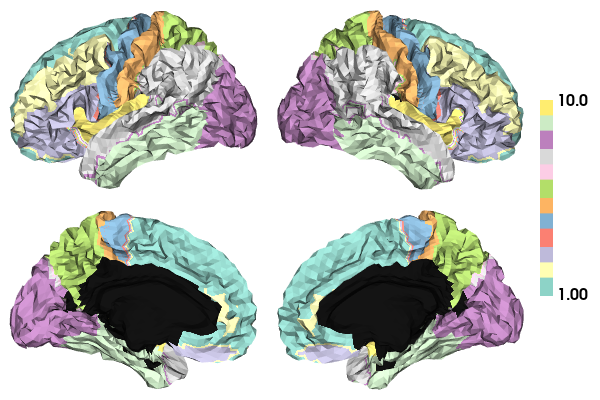

In [150]:
import cmocean

# plot labels on surface
plot_hemispheres(MNI_wmL, MNI_wmR, array_name=blades, size=(600, 400), zoom=1.6, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), cmap='Set3', transparent_bg=False, color_bar='right', layout_style='grid')

In [151]:
sG1 = grad[0]

# Find indices where mesu_5k has values 1, 2, 3, and 4
indices_1 = np.where(blades == 1)[0]
indices_2 = np.where(blades == 2)[0]
indices_3 = np.where(blades == 3)[0]
indices_4 = np.where(blades == 4)[0]
indices_5 = np.where(blades == 5)[0]
indices_6 = np.where(blades == 6)[0]
indices_7 = np.where(blades == 7)[0]
indices_8 = np.where(blades == 8)[0]
indices_9 = np.where(blades == 9)[0]
indices_10 = np.where(blades == 10)[0]

# Extract values from sgrad corresponding to these indices
values_1 = sG1[indices_1]
values_2 = sG1[indices_2]
values_3 = sG1[indices_3]
values_4 = sG1[indices_4]
values_5 = sG1[indices_5]
values_6 = sG1[indices_6]
values_7 = sG1[indices_7]
values_8 = sG1[indices_8]
values_9 = sG1[indices_9]
values_10 = sG1[indices_10]

### Plotting Ridge Graph (Sorted)

In [152]:
import numpy as np
import pandas as pd
from easy_mpl import ridge
import matplotlib.pyplot as plt
from easy_mpl.utils import version_info

sG1 = grad[0] # G1 plotting

# Find indices where mesu_5k has values 1, 2, 3, and 4
indices_1 = np.where(blades == 1)[0]
indices_2 = np.where(blades == 2)[0]
indices_3 = np.where(blades == 3)[0]
indices_4 = np.where(blades == 4)[0]
indices_5 = np.where(blades == 5)[0]
indices_6 = np.where(blades == 6)[0]
indices_7 = np.where(blades == 7)[0]
indices_8 = np.where(blades == 8)[0]
indices_9 = np.where(blades == 9)[0]
indices_10 = np.where(blades == 10)[0]

# Extract values from sgrad corresponding to these indices
values_1 = sG1[indices_1]
values_2 = sG1[indices_2]
values_3 = sG1[indices_3]
values_4 = sG1[indices_4]
values_5 = sG1[indices_5]
values_6 = sG1[indices_6]
values_7 = sG1[indices_7]
values_8 = sG1[indices_8]
values_9 = sG1[indices_9]
values_10 = sG1[indices_10]

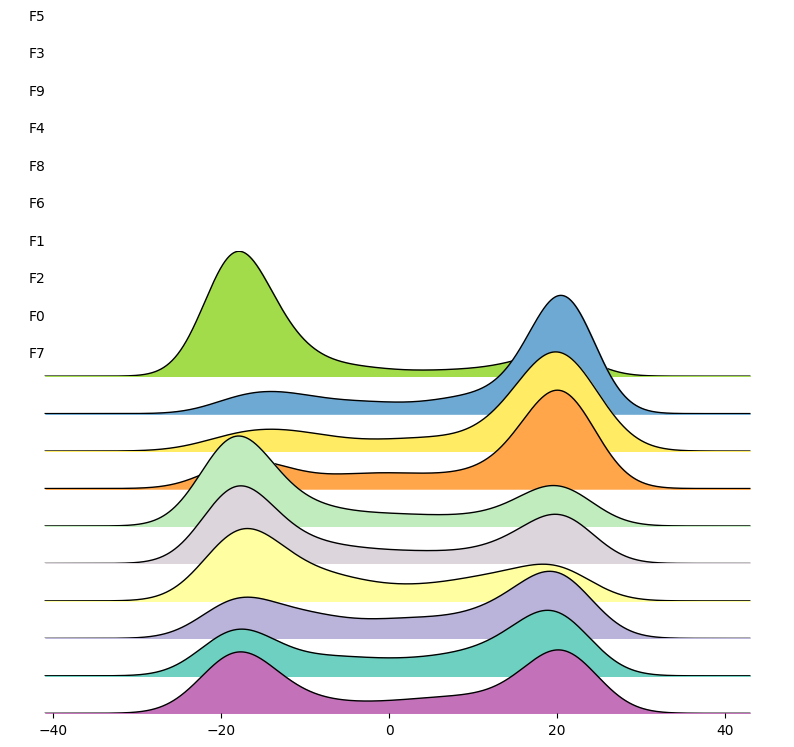

In [154]:
custom4G1 = [(163/255, 220/255, 74/255),   # 6
             (110/255, 169/255, 211/255),  # 4
             (255/255, 236/255, 100/255),   # 10
             (255/255, 166/255, 74/255),   # 5
             (193/255, 237/255, 190/255),  # 9
             (220/255, 213/255, 220/255),  # 7
             (255/255, 255/255, 162/255),  # 2
             (186/255, 179/255, 218/255),  # 3
             (110/255, 208/255, 193/255),  # 1
             (195/255, 114/255, 186/255)]  # 8

_ = ridge([values_1, values_2, values_3, values_4, values_5, values_6, values_7, values_8, values_9, values_10], color=custom4G1)

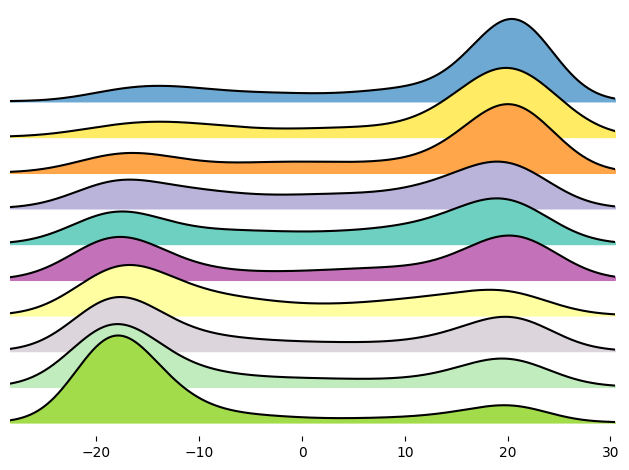

In [156]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np; np.random.seed(2)
import random; random.seed(2)
import joypy

custom4G1 = [(110/255, 169/255, 211/255),  # 4
             (255/255, 236/255, 100/255),   # 10
             (255/255, 166/255, 74/255),   # 5
             (186/255, 179/255, 218/255),  # 3
             (110/255, 208/255, 193/255),  # 1
             (195/255, 114/255, 186/255),  # 8
             (255/255, 255/255, 162/255),  # 2
             (220/255, 213/255, 220/255),  # 7
             (193/255, 237/255, 190/255),  # 9
             (163/255, 220/255, 74/255)]   # 6

# Sample data
df = [values_4, values_10, values_5, values_3, values_1, values_8, values_2, values_7, values_9, values_6]

fig, ax = joypy.joyplot(df, color = custom4G1)

# plt.show()

## Plot the mean G1 by atlas

In [157]:
from brainspace.utils.parcellation import reduce_by_labels
from brainspace.utils.parcellation import map_to_labels

# Parcelate cortical timeseries with BrainSpace
sG1_blades = reduce_by_labels(sG1, blades)

# Get the unique ROIs
unique_roi = np.unique(blades)

# Number of unique values
N_unique = len(unique_roi)

# Create an empty array with shape [ 'Number of time points' X 'ROIs' ]
sG1_blades = np.zeros([N_unique])

/data/mica1/03_projects/youngeun/venv/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/data/mica1/03_projects/youngeun/venv/lib/python3.8/site-packages/numpy/core/_methods.py:182: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


In [158]:
# Get the mean value of the time series by ROI
for lab in range(N_unique):
    tmpData = sG1[blades == unique_roi[lab]]
    sG1_blades[lab] = np.nanmean(tmpData)
    del(tmpData)

/tmp/ipykernel_807589/4149781553.py:4: RuntimeWarning: Mean of empty slice
  sG1_blades[lab] = np.nanmean(tmpData)


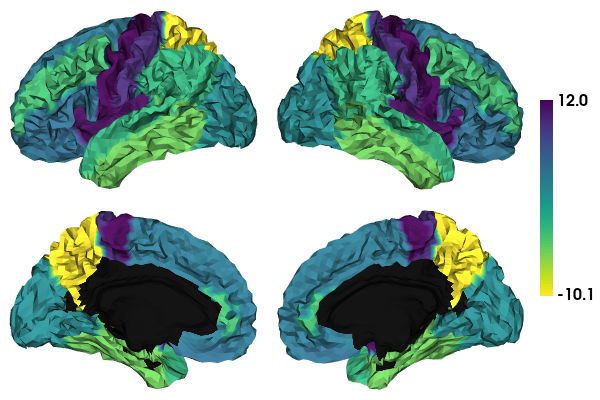

In [200]:
# Map back to surface fsLR-32k
sG1_blades_surf = map_to_labels(sG1_blades, blades)

# Plot of the mean of the parcellated timeseries on the surface
plot_hemispheres(MNI_wmL, MNI_wmR, array_name=sG1_blades_surf, size=(600, 400), zoom=1.6, embed_nb=True, 
                 interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), cmap='viridis_r', transparent_bg=False, color_bar='right', layout_style='grid')

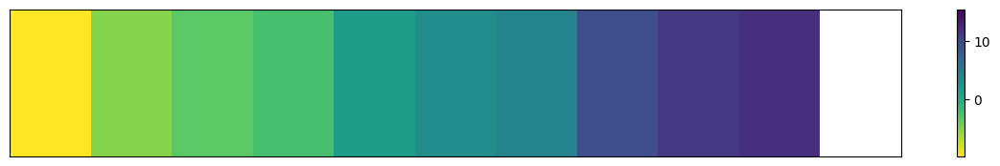

In [205]:
sorted_array = np.sort(sG1_blades).reshape(1, -1)

# Adjust the figure size as per your requirement
plt.figure(figsize=(15, 2))  # Adjust the values (width, height) as needed

# COlor range
xlim = [-9.87,15.5]

# Plot the pcolormesh
pcm = plt.pcolormesh(sorted_array, cmap='viridis_r', shading='auto', vmin = xlim[0], vmax = xlim[1])

# Set labels
#plt.xlabel('Vertices')
plt.xticks([])
plt.yticks([])  # Remove y-axis labels

cbar = plt.colorbar(pcm)

plt.show()

### SWM gradients without smoothing

In [65]:
# Labels and boolean mask
MPC = build_mpc(corrected_intensity_profiles, mask_surf) # compute MPC

/tmp/ipykernel_428835/229246543.py:59: RuntimeWarning: divide by zero encountered in divide
  MPC = 0.5 * np.log( np.divide(1 + R, 1 - R) )


In [66]:
# Calculate the gradients
Ngrad=5
MPC_all, grad = mpc_dm(MPC, mask_surf, Ngrad=Ngrad, kernel='cosine', sparsity=0.95)

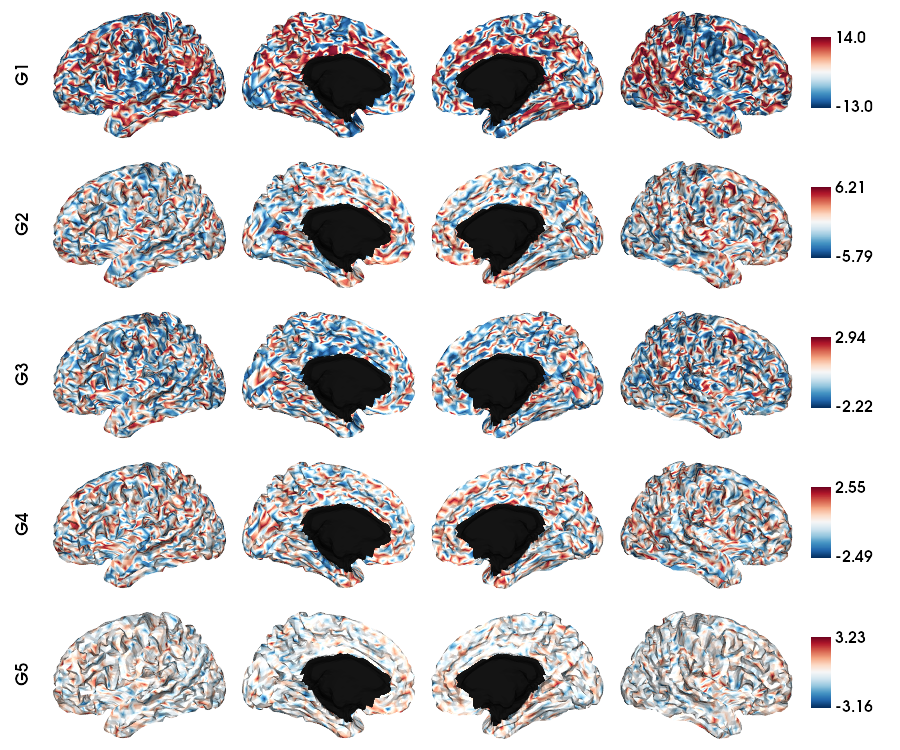

In [67]:
# Load MNI white matter surface
MNI_wmL = read_surface(f'{out_surf}/sub-MNI152_hemi-L_space-nativepro_surf-{surf}_label-white.surf.gii', itype='gii')
MNI_wmR = read_surface(f'{out_surf}/sub-MNI152_hemi-R_space-nativepro_surf-{surf}_label-white.surf.gii', itype='gii')

# plot the gradients
labels=['G'+str(x) for x in list(range(1,Ngrad+1))]
plot_hemispheres(ws_lh, ws_rh, array_name=grad, cmap='RdBu_r', nan_color=(0, 0, 0, 1),
  zoom=1.5, size=(900, 750), embed_nb=True,
  color_bar='right', label_text={'left': labels}, screenshot=False)

## GM gradients from the BB

In [162]:
fsLR5k_GM = f"/host/percy/local_raid/youngeun/sub-BigBrain/Histological-Space/from_BigBrainWarp/tpl-fs_LR_den-32k_desc-profiles.txt"
GM = np.loadtxt(fsLR5k_GM, delimiter=',')
GM = GM.astype(np.int32)
num_col = GM.shape[1]
half_col = num_col // 2
GM_L = GM[:, :half_col]
GM_R = GM[:, half_col:]

num_rows, num_colums = GM_L.shape

for i in range(num_rows):
    row_data = GM_L[i, :]
    data_array = nb.gifti.GiftiDataArray(row_data.astype(np.float32))
    img = nb.gifti.GiftiImage()
    img.add_gifti_data_array(data_array)
    filename = f"fsLR-32k.L_bigbrain_{i:02d}.func.gii"
    nb.save(img, "/host/percy/local_raid/youngeun/sub-BigBrain/Histological-Space/from_BigBrainWarp/fsLR32k/" + filename)

### BB Cortical gradients in fsLR32k surface

In [7]:
mid_row_index = GM.shape[0] // 2
mid_GM = GM[mid_row_index]

In [23]:
mid_GM[np.isnan(mid_GM)] = 0

# Perform linear regression
model = LinearRegression()
model.fit(sorted_y_32k.reshape(-1, 1), mid_GM)

# Predict intensity values using the regression model
predicted_intensity = model.predict(sorted_y_32k.reshape(-1, 1))

# Correct intensity values
corrected_intensity_values = mid_GM - predicted_intensity

# Update the intensity values in the original data
reg_mean5k = corrected_intensity_values

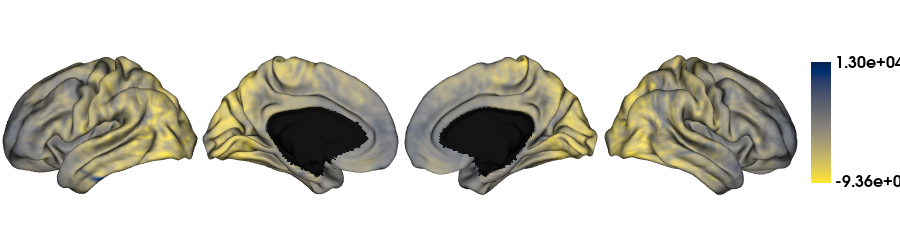

In [24]:
reg_mean5k[mask_32k==False] = np.nan

# Plot average SWM surfaces
plot_hemispheres(f32k_lh, f32k_rh, array_name=reg_mean5k, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False)

In [28]:
# Labels and boolean mask
mask_surf32 = mask_32k != 0
MPC = build_mpc(GM, mask_surf32) # compute MPC

/data/mica1/03_projects/youngeun/venv/lib/python3.8/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


KeyboardInterrupt: 

In [ ]:
# Calculate the gradients
Ngrad=3
MPC_all, grad = mpc_dm(MPC, mask_surf32, Ngrad=Ngrad, kernel='cosine', sparsity=0.95)

In [ ]:
# plot the gradients
labels=['G'+str(x) for x in list(range(1,Ngrad+1))]
plot_hemispheres(f32k_lh, f32k_rh, array_name=grad, cmap='RdBu_r', nan_color=(0, 0, 0, 1),
  zoom=1.2, size=(900, 750), embed_nb=True, color_range = 'sym',
  color_bar='right', label_text={'left': labels}, screenshot=False)

### BB Cortical gradients in fsLR5k surface

In [163]:
cmean5k, cmap5k = load_GM_group_5k()
cmean5k[mask_5k==False] = np.nan
#map5k[np.isnan(map5k)] = 0

Numer of surfaces: 50


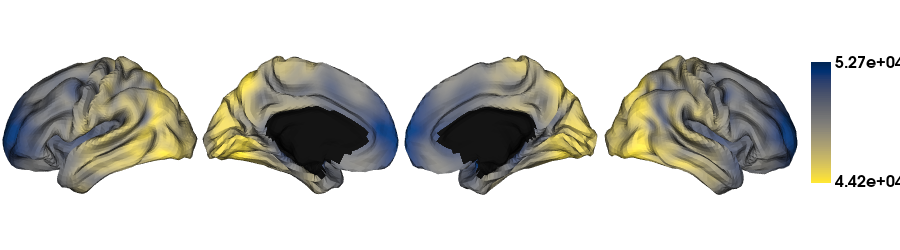

In [30]:
# Plot average SWM surfaces
plot_hemispheres(f5k_lh, f5k_rh, array_name=cmean5k, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False)

In [169]:
from scipy.stats import spearmanr
from scipy.stats import pearsonr

spearman_correlations = np.zeros(9684)
p_values = np.zeros(9684)

map5k_no_first_row = map5k[1:, :]

for i in range(9684):
    col1 = map5k_no_first_row[:, i]
    col2 = cmap5k[:, i]
    correlation, p_value = spearmanr(col1, col2)
    spearman_correlations[i] = correlation
    p_values[i] = p_value

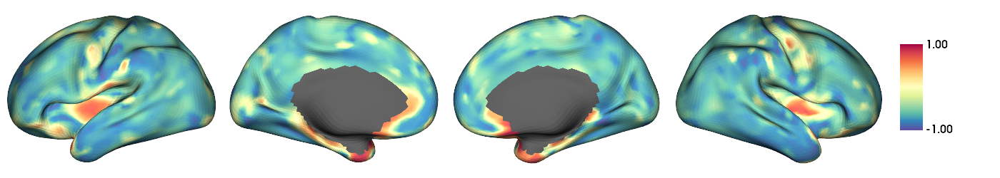

In [212]:
# plot labels on surface
plot_hemispheres(inf_lh, inf_rh, array_name=spearman_correlations, size=(1400, 250), zoom=1.5, embed_nb=True, interactive=False, share='both',
                 nan_color=(0.3, 0.3, 0.3, 1), cmap='Spectral_r', transparent_bg=True, color_bar='right', color_range=(-1,1))

In [176]:
# Find positions where NaN values exist
nan_indices = np.isnan(map5k_no_first_row) | np.isnan(cmap5k)

# Arrays to store Pearson correlations and p-values
pearson_correlations = np.zeros(map5k_no_first_row.shape[1])
p_values = np.zeros(map5k_no_first_row.shape[1])

# Calculate Pearson correlation for each column
for i in range(map5k_no_first_row.shape[1]):
    # Select only non-NaN data for correlation calculation
    valid_indices = ~nan_indices[:, i]
    col1 = map5k_no_first_row[valid_indices, i]
    col2 = cmap5k[valid_indices, i]
    
    if len(col1) > 1 and len(col2) > 1:  # Calculate correlation if at least 2 data points are available
        correlation, p_value = pearsonr(col1, col2)
        pearson_correlations[i] = correlation
        p_values[i] = p_value
    else:
        pearson_correlations[i] = np.nan
        p_values[i] = np.nan

# Print the results
print("Pearson Correlations:", pearson_correlations)
print("P-values:", p_values)

Pearson Correlations: [-0.47881307 -0.92093938 -0.84438227 ... -0.68470157 -0.86606809
 -0.82764278]
P-values: [4.35627575e-04 2.80968357e-21 1.31500475e-14 ... 4.16940270e-08
 4.63588871e-16 1.25026974e-13]


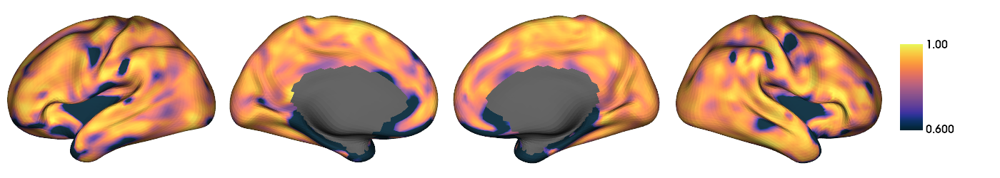

In [193]:
# plot labels on surface
plot_hemispheres(inf_lh, inf_rh, array_name=np.abs(pearson_correlations), size=(1400, 250), zoom=1.5, embed_nb=True, interactive=False, share='both',
                 nan_color=(0.3, 0.3, 0.3, 1), cmap='cmo.thermal', transparent_bg=True, color_bar='right', color_range=(0.6,1))

### data regression

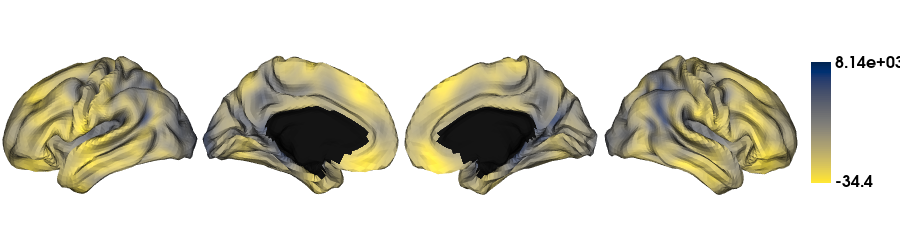

In [31]:
mid_index = cmap5k.shape[0] // 2
mid_row = cmap5k[mid_index]

# Perform RANSAC regression
ransac = RANSACRegressor()
ransac.fit(y_fsLR5k[mask_5k==True].reshape(-1, 1), mid_row[mask_5k==True])
predicted_intensity = ransac.predict(y_fsLR5k[mask_5k==True].reshape(-1, 1))

# Correct intensity values
corrected_intensity_profiles = np.empty_like(cmap5k)
for i, row in enumerate(cmap5k):
    corrected_intensity_values = row[mask_5k==True] - predicted_intensity

    # Initialize an array to hold corrected intensity values with NaNs
    reg_mean5k = np.full_like(cmean5k, np.nan)
    # Get the indices where mask_5k is True
    indices_5k = np.where(mask_5k)
    # Update the corrected intensity values with the masked data
    reg_mean5k[indices_5k] = corrected_intensity_values
    corrected_intensity_profiles[i] = reg_mean5k 

RANSAC_mean5k = np.mean(corrected_intensity_profiles, axis=0)

# Plot average SWM surfaces
plot_hemispheres(f5k_lh, f5k_rh, array_name=RANSAC_mean5k, size=(900, 250), color_bar='right', zoom=1.25, embed_nb=True, interactive=False, share='both', nan_color=(0, 0, 0, 1), 
                 cmap='cividis_r', transparent_bg=False, screenshot=False)

In [32]:
# Labels and boolean mask
MPC = build_mpc(corrected_intensity_profiles, mask_surf) # compute MPC

/tmp/ipykernel_705759/4174464588.py:59: RuntimeWarning: divide by zero encountered in divide
  MPC = 0.5 * np.log( np.divide(1 + R, 1 - R) )


In [33]:
# Calculate the gradients
Ngrad=5
MPC_all, grad = mpc_dm(MPC, mask_surf, Ngrad=Ngrad, kernel='cosine', sparsity=0.95)

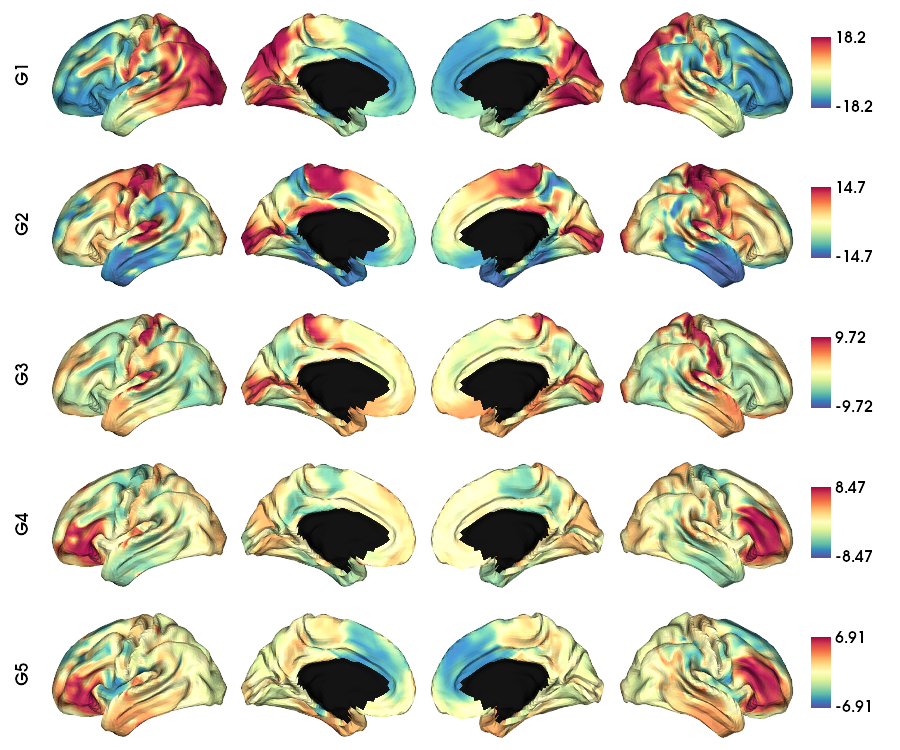

In [34]:
# Load MNI white matter surface
# plot the gradients
labels=['G'+str(x) for x in list(range(1,Ngrad+1))]
plot_hemispheres(f5k_lh, f5k_rh, array_name=grad, cmap='Spectral_r', nan_color=(0, 0, 0, 1),
  zoom=1.5, size=(900, 750), embed_nb=True, color_range = 'sym',
  color_bar='right', label_text={'left': labels}, screenshot=False)

/data/mica1/03_projects/youngeun/venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/gradient/embedding.py:70: UserWarning: Affinity is not symmetric. Making symmetric.
  warnings.warn('Affinity is not symmetric. Making symmetric.')
/data/mica1/03_projects/youngeun/venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/gradient/embedding.py:77: UserWarning: Graph is not fully connected.
  warnings.warn('Graph is not fully connected.')


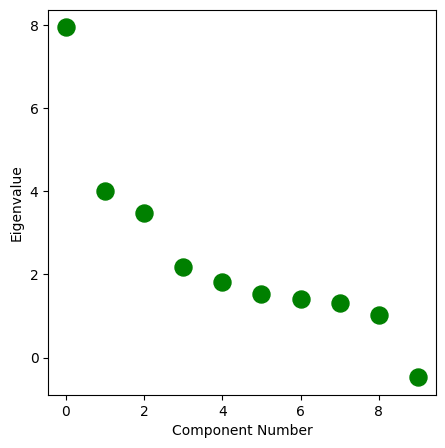

In [35]:
from brainspace.gradient import GradientMaps

# Ask for 10 gradients (default)
gm = GradientMaps(n_components=10, random_state=0)
gm.fit(MPC)

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, figsize=(5, 5))
ax.scatter(range(gm.lambdas_.size), gm.lambdas_, s=150, c='green')
ax.set_xlabel('Component Number')
ax.set_ylabel('Eigenvalue')

plt.show()

In [122]:
np.save('/host/percy/local_raid/youngeun/myjupyter/array/BB_GM_G1.npy', grad[0])
np.save('/host/percy/local_raid/youngeun/myjupyter/array/BB_GM_G2.npy', grad[1])

In [ ]:
# Identify rows with NaN values and exclude them
data = map5k
data[:, mask_5k == False] = np.nan
valid_rows = ~np.isnan(data).any(axis=0)
data_sliced = data[:, valid_rows]

# Adjust the figure size as per your requirement
plt.figure(figsize=(15, 8))  # Adjust the values (width, height) as needed

# COlor range
#xlim = [900,2200]

# Plot the pcolormesh
pcm = plt.pcolormesh(data_sliced, cmap='gray', shading='auto')

# Set labels
#plt.xlabel('Vertices')
plt.xticks([])
plt.yticks([])  # Remove y-axis labels

cbar = plt.colorbar(pcm)

plt.show()

In [36]:
BB_G1 = grad[0]
BB_G2 = grad[1]

SWM_mMPC = np.load('/host/percy/local_raid/youngeun/myjupyter/array/mMPC_5k_SWM_G1.npy')
SWM_T1map = np.load('/host/percy/local_raid/youngeun/myjupyter/array/T1map_SWM_G1.npy')
SWM_MTSAT = np.load('/host/percy/local_raid/youngeun/myjupyter/array/MTSAT_SWM_G1_new.npy')
SWM_FA = np.load('/host/percy/local_raid/youngeun/myjupyter/array/FA_SWM_G1.npy')
SWM_ODI = np.load('/host/percy/local_raid/youngeun/myjupyter/array/ODI_SWM_G1.npy')

GM_T1map = np.load('/host/percy/local_raid/youngeun/myjupyter/array/T1map_GM_G1.npy')

<Figure size 800x600 with 0 Axes>

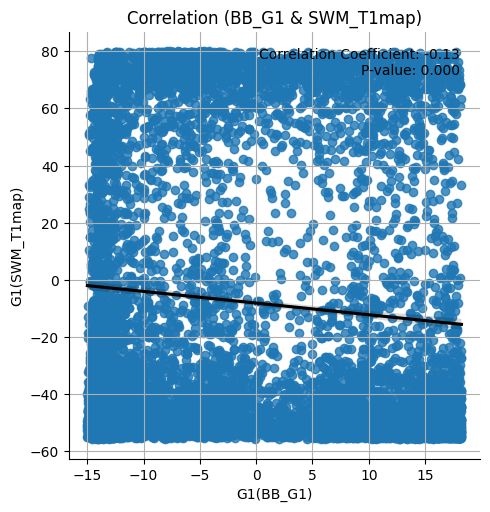

In [41]:
valid_indices = ~np.isnan(BB_G1) & ~np.isnan(SWM_T1map)
valid_BB_G1 = BB_G1[valid_indices]
valid_SWM_T1map = SWM_T1map[valid_indices]

# Calculate Spearman correlation coefficient and p-value
r, p = sp.stats.spearmanr(valid_BB_G1, valid_SWM_T1map)

# Convert NumPy arrays to a DataFrame
df = pd.DataFrame({'BB_G1': valid_BB_G1, 'SWM_T1map': valid_SWM_T1map})

# Plot scatter plot and add a linear regression line using seaborn
plt.figure(figsize=(8, 6))
sns.lmplot(x='BB_G1', y='SWM_T1map', data=df, line_kws={'color': 'black'})

plt.title('Correlation (BB_G1 & SWM_T1map)')
plt.xlabel('G1(BB_G1)')
plt.ylabel('G1(SWM_T1map)')
plt.text(0.95, 0.9, f'Correlation Coefficient: {r:.2f}\nP-value: {p:.3f}', transform=plt.gca().transAxes, ha='right')

plt.grid(True)
plt.show()

<Figure size 800x600 with 0 Axes>

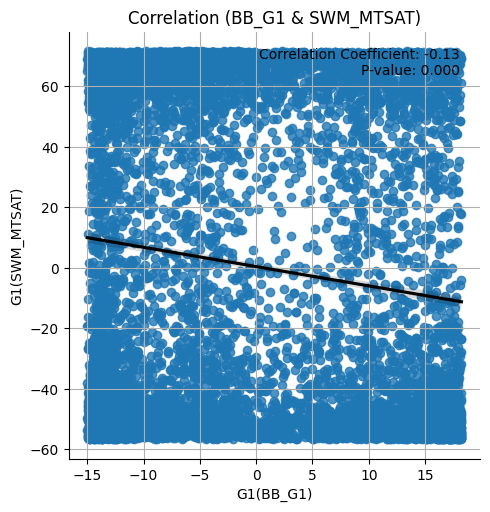

In [42]:
valid_indices = ~np.isnan(BB_G1) & ~np.isnan(SWM_MTSAT)
valid_BB_G1 = BB_G1[valid_indices]
valid_SWM_MTSAT = SWM_MTSAT[valid_indices]

# Calculate Spearman correlation coefficient and p-value
r, p = sp.stats.spearmanr(valid_BB_G1, valid_SWM_MTSAT)

# Convert NumPy arrays to a DataFrame
df = pd.DataFrame({'BB_G1': valid_BB_G1, 'SWM_MTSAT': valid_SWM_MTSAT})

# Plot scatter plot and add a linear regression line using seaborn
plt.figure(figsize=(8, 6))
sns.lmplot(x='BB_G1', y='SWM_MTSAT', data=df, line_kws={'color': 'black'})

plt.title('Correlation (BB_G1 & SWM_MTSAT)')
plt.xlabel('G1(BB_G1)')
plt.ylabel('G1(SWM_MTSAT)')
plt.text(0.95, 0.9, f'Correlation Coefficient: {r:.2f}\nP-value: {p:.3f}', transform=plt.gca().transAxes, ha='right')

plt.grid(True)
plt.show()